<div class="span5 alert alert-info">
    
## Capstone Project 1
1. [DataWrangling](#Data-Wrangling)
   1. [Reading the Files and Cleaning the Data](#Cleaning)
   2. [Redundant columns](#Redundant)
   3. [Demographics Map](#Demographics)
2. [Exploratory Data Analysis](#EDA)
   1. [Measures of Birth and Death](#Measures)
   2. [Correlated Variables](#Correlated)
   3. [Demographics Map --States](#Demographics-States)
3. [Final DataFrame](#df_final)
4. [Modeling](#Modeling)
    1. [Breast Cancer: Fitting Linear Regression using `sklearn`](#Brst_Cancer_Reg)
    2. [Breast Cancer: Unsupervised Clustering](#Brst_Cancer_Clustering)
    3. [Coronary Heart Disease](#CHD)

### *File Descriptions*


* DATA_ELEMENT_DESCRIPTION.csv defines each data element and indicates where its description is found in Data Sources, Definitions, and Notes.
* DEFINED_DATA_VALUE.csv defines the meaning of specific values (such as missing or suppressed data). 
* DEMOGRAPHICS.csv identifies the data elements and values in the Demographics indicator domain.
* HEALTHY_PEOPLE_2010.csv identifies the Healthy People 2010 Targets and the U.S. Percentages or Rates.
* LEADING_CAUSES_OF_DEATH.csv identifies the data elements and values in the Leading Causes of Death indicator domain.
* MEASURES_OF_BIRTH_AND_DEATH.csv identifies the data elements and values in the Measures of Birth and Death indicator domain.
* PREVENTIVE_SERVICES_USE.csv identifies the data elements and values in the Preventive Services indicator domain.
* RELATIVE_HEALTH_IMPORTANCE.csv identifies the data elements and values in the Relative Health Importance indicator domain.
* RISK_FACTORS_AND_ACCESS_TO_CARE.csv identifies the data elements and values in the Risk Factors and Access to Care indicator domain.
* SUMMARY_MEASURES_OF_HEALTH.csv identifies the data elements and values in the Summary Measures of Health indicator domain.
* VULNERABLE_POPS_AND_ENV_HEALTH.csv identifies the data elements and values in the Vulnerable Populations and Environmental Health indicator domain.


    
Data source can be found [here](https://healthdata.gov/dataset/community-health-status-indicators-chsi-combat-obesity-heart-disease-and-cancer/resource)



In [1]:
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
from matplotlib.pyplot import figaspect
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd
import seaborn as sns
import scipy as sp
from scipy.stats.stats import pearsonr
from scipy.stats import norm
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
Data Wrangling
mpl.rcParams.update({'font.size': 14})


<div class="span5 alert alert-info">

## 1. Data Wrangling  <a class="anchor" id="Data-Wrangling"></a>

<div class="span5 alert alert-info">
    
### 1.A. Reading the Files and Cleaning the Data  <a class="anchor" id="Cleaning"></a>

In [74]:
#Reading all 11 csv files
files = sorted(glob.glob('../CHSI_dataset/*.csv'))  

In [3]:
DATA_ELEMENT_DESCRIPTION = pd.read_csv(files[0])
DEFINED_DATA_VALUE = pd.read_csv(files[1])
DEMOGRAPHICS = pd.read_csv(files[2])
HEALTHY_PEOPLE_2010 = pd.read_csv(files[3])
LEADING_CAUSES_OF_DEATH = pd.read_csv(files[4])
MEASURES_OF_BIRTH_AND_DEATH = pd.read_csv(files[5])
PREVENTIVE_SERVICES_USE = pd.read_csv(files[6])
RELATIVE_HEALTH_IMPORTANCE = pd.read_csv(files[7])
RISK_FACTORS_AND_ACCESS_TO_CARE = pd.read_csv(files[8])
SUMMARY_MEASURES_OF_HEALTH = pd.read_csv(files[9])
VULNERABLE_POPS_AND_ENV_HEALTH = pd.read_csv(files[10])

In [4]:
#Auxiliary files 
DATA_ELEMENT_DESCRIPTION
DEFINED_DATA_VALUE
HEALTHY_PEOPLE_2010

,Categories,Elements,US_Pct_or_Rate_2003,Healthy_People_2010_Target
0,Birth Measures,Low Birth Wt. (<2500 g),7.9,5.0
1,Birth Measures,Very Low Birth Wt. (<1500 g),1.4,0.9
2,Birth Measures,Premature Births (<37 weeks),12.3,7.6
3,Birth Measures,Births to Women under 18,3.4,-9998.9
4,Birth Measures,Births to Women over 40,2.6,-9998.9
5,Birth Measures,Births to Unmarried Women,34.6,-9998.9
6,Birth Measures,No Care in First Trimester,16.0,10.0
7,Infant Mortality,Infant Mortality,6.8,4.5
8,Infant Mortality,White non Hispanic Infant Mortality,5.7,4.5
9,Infant Mortality,Black non Hispanic Infant Mortality,13.6,4.5


In [5]:
LEADING_CAUSES_OF_DEATH.head()

,State_FIPS_Code,County_FIPS_Code,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Strata_ID_Number,A_Wh_Comp,CI_Min_A_Wh_Comp,CI_Max_A_Wh_Comp,A_Bl_Comp,...,F_Bl_Cancer,CI_Min_F_Bl_Cancer,CI_Max_F_Bl_Cancer,F_Ot_Cancer,CI_Min_F_Ot_Cancer,CI_Max_F_Ot_Cancer,F_Hi_Cancer,CI_Min_F_Hi_Cancer,CI_Max_F_Hi_Cancer,LCD_Time_Span
0,1,1,Autauga,Alabama,AL,29,-1111,-1111,-1111,-1111,...,19,14,23,-1111,-1111,-1111,-1111,-1111,-1111,1999-2003
1,1,3,Baldwin,Alabama,AL,16,57,39,75,-1111,...,20,15,25,-1111,-1111,-1111,-1111,-1111,-1111,2001-2003
2,1,5,Barbour,Alabama,AL,51,-1111,-1111,-1111,-1111,...,26,22,31,-1111,-1111,-1111,-1111,-1111,-1111,1999-2003
3,1,7,Bibb,Alabama,AL,42,-1111,-1111,-1111,-1111,...,20,14,25,-1111,-1111,-1111,-1111,-1111,-1111,1994-2003
4,1,9,Blount,Alabama,AL,28,34,17,52,-1111,...,28,10,46,-1111,-1111,-1111,-1111,-1111,-1111,1999-2003


In [6]:
#Outlier column name
DATA_ELEMENT_DESCRIPTION.update(
    DATA_ELEMENT_DESCRIPTION.replace('C_Ot_homicide','C_Ot_Homicide'))
LEADING_CAUSES_OF_DEATH.rename(columns={'C_Ot_homicide':'C_Ot_Homicide'}, inplace=True)

#Functions to describe acronyms
def description(param):
    if param in list(DATA_ELEMENT_DESCRIPTION.COLUMN_NAME):
        description_value = DATA_ELEMENT_DESCRIPTION[DATA_ELEMENT_DESCRIPTION.
                                     COLUMN_NAME==param].DESCRIPTION.tolist()[0]
    else:
        description_value = ''   
    return description_value

def short_description(param):
    list_of_removing = ['County data,', 'death measures,', 'birth measures,', ',']
    result = description(param)
    for i in list_of_removing:
        if result.__contains__(i):
            result = result.replace(i,'')
    return result

def short_race_description(param):
    list_of_removing = ['Black', 'Hispanic','White', 'other', 
                        'County data,', 'death measures,', 'birth measures,', ',']
    result = description(param)
    for i in list_of_removing:
        if result.__contains__(i):
            result = result.replace(i,'')
    return result

In [7]:
#Common columns in all worksheets
county_info = ['State_FIPS_Code', 'County_FIPS_Code', 'CHSI_County_Name',
               'CHSI_State_Name', 'CHSI_State_Abbr', 'Strata_ID_Number']


In [8]:
#Joining files
worksheets = [DEMOGRAPHICS,
LEADING_CAUSES_OF_DEATH,
MEASURES_OF_BIRTH_AND_DEATH, 
PREVENTIVE_SERVICES_USE,
RELATIVE_HEALTH_IMPORTANCE,
RISK_FACTORS_AND_ACCESS_TO_CARE,
SUMMARY_MEASURES_OF_HEALTH,
VULNERABLE_POPS_AND_ENV_HEALTH]


In [9]:
#Replacing not available/reported data by zeros
nan_values = [-1111, -1111.1, -1, -9999, -2222, -2222.2, -2]
for worksheet in worksheets:
    nda =[]
    for i,nan_value in enumerate(nan_values):
        nda.append(worksheet.loc[:,:]!=nan_value)
        worksheet.update(worksheet.where(nda[i]).fillna(0))        

In [10]:
#Time dependent data should be identified and normalized
time_dependent_worksheets = [LEADING_CAUSES_OF_DEATH,
MEASURES_OF_BIRTH_AND_DEATH,
PREVENTIVE_SERVICES_USE,
VULNERABLE_POPS_AND_ENV_HEALTH]


time_spans = ['1994-2003', '1999-2003', '2001-2003']
time_span_convert = [7,4,2]
for worksheet in time_dependent_worksheets:
    for i in list(worksheet.columns):
        if i.__contains__('Time_Span'):
            worksheet[i].replace(time_spans, time_span_convert, inplace=True)
            worksheet.rename(columns={i: 'Time'}, inplace=True)

for worksheet in time_dependent_worksheets:
    for i in list(worksheet.columns):
        if worksheet.columns.get_loc(i) < worksheet.columns.get_loc('Time') and i not in county_info:
            worksheet[i]=worksheet[i]/worksheet['Time']
          

In [11]:
#Convert population percentage to numeric 
Demographics_percent = ['Age_19_64', 'Age_19_Under', 'Age_65_84','Age_85_and_Over','Poverty',
                        'Asian', 'Black', 'Hispanic', 'Native_American', 'White']
for i in Demographics_percent:
    DEMOGRAPHICS[i].update((DEMOGRAPHICS[i]*DEMOGRAPHICS['Population_Size'])/100)   

In [12]:
#Merging all clean data files
df = worksheets[0]
for name in worksheets[1:]:
    df = df.merge(name, on=county_info.append('Time'), how='outer', sort=True).drop_duplicates().fillna(0)    

In [13]:
df.head()

,State_FIPS_Code,County_FIPS_Code,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Strata_ID_Number,Strata_Determining_Factors,Number_Counties,Population_Size,Min_Population_Size,...,Shig_Rpt,Shig_Rpt_Ind,Shig_Exp,Toxic_Chem,Carbon_Monoxide_Ind,Nitrogen_Dioxide_Ind,Sulfur_Dioxide_Ind,Ozone_Ind,Particulate_Matter_Ind,Lead_Ind
0,1,1,Autauga,Alabama,AL,29,"frontier status, population size, poverty, age",37,48612,28447,...,1.000000,0.750000,2.750000,720799.250000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000
1,1,3,Baldwin,Alabama,AL,16,"frontier status, population size, poverty, age",27,162586,118395,...,20.500000,2.000000,6.500000,17832.000000,0.500000,0.500000,0.500000,1.000000,0.500000,0.500000
2,1,5,Barbour,Alabama,AL,51,"frontier status, population size, poverty, age...",33,28414,27269,...,0.250000,0.750000,4.000000,12468.500000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000
3,1,7,Bibb,Alabama,AL,42,"frontier status, population size, poverty, age",53,21516,8134,...,0.428571,0.428571,2.285714,1043.142857,0.142857,0.142857,0.142857,0.142857,0.142857,0.142857
4,1,9,Blount,Alabama,AL,28,"frontier status, population size, poverty, age",39,55725,29009,...,2.750000,1.000000,1.250000,222255.000000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000


<div class="span5 alert alert-info">

### 1.B. Redundant columns  <a class="anchor" id="Redundant"></a>

In [14]:
observation = list(df.columns)
description_list = [description(i) for i in observation]
def observ_keyword(variable):
    results = []
    for i, j in enumerate(description_list):
        if variable in str(j):
            results.append(observation[i])
    return results

In [15]:
filter_percentile = list(description(i) for i in list(observ_keyword('percentile')))
filter_CI = list(description(i) for i in list(observ_keyword('Confidence interval'))) 
filter_fav = list(description(i) for i in list(observ_keyword('Favorable indicator')))

filters = list(observ_keyword('Favorable indicator') 
               + observ_keyword('Confidence interval') 
               + observ_keyword('percentile'))
df = df.drop(columns=[*filters, 'Strata_Determining_Factors','State_FIPS_Code', 'County_FIPS_Code'])

In [16]:
#Neutral columns
for i in list(df.columns):
    if len(np.unique(df[i]))==1 and i!='D_Ot_HIV':
        df=df.drop(columns=i)
df.head()

,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Strata_ID_Number,Number_Counties,Population_Size,Population_Density,Poverty,Age_19_Under,Age_19_64,...,Salm_Exp,Shig_Rpt,Shig_Exp,Toxic_Chem,Carbon_Monoxide_Ind,Nitrogen_Dioxide_Ind,Sulfur_Dioxide_Ind,Ozone_Ind,Particulate_Matter_Ind,Lead_Ind
0,Autauga,Alabama,AL,29,37,48612,82.0,5055.648,13076.628,30285.276,...,7.750000,1.000000,2.750000,720799.250000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000
1,Baldwin,Alabama,AL,16,27,162586,102.0,16583.772,38207.710,98039.358,...,33.500000,20.500000,6.500000,17832.000000,0.500000,0.500000,0.500000,1.000000,0.500000,0.500000
2,Barbour,Alabama,AL,51,33,28414,32.0,6279.494,6904.602,17758.750,...,7.250000,0.250000,4.000000,12468.500000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000
3,Bibb,Alabama,AL,42,53,21516,35.0,3614.688,5292.936,13619.628,...,4.571429,0.428571,2.285714,1043.142857,0.142857,0.142857,0.142857,0.142857,0.142857,0.142857
4,Blount,Alabama,AL,28,39,55725,86.0,6631.275,13652.625,34605.225,...,7.750000,2.750000,1.250000,222255.000000,0.250000,0.250000,0.250000,0.250000,0.250000,0.250000


In [17]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Strata_ID_Number,3141.0,44.696275,2.511843e+01,1.000000,23.000000,44.000000,66.000000,8.800000e+01
Number_Counties,3141.0,38.486151,1.029019e+01,15.000000,32.000000,37.000000,45.000000,6.200000e+01
Population_Size,3141.0,94368.164279,3.064317e+05,62.000000,11211.000000,25235.000000,64040.000000,9.935475e+06
Population_Density,3141.0,249.826807,1.702476e+03,0.000000,17.000000,44.000000,109.000000,6.939000e+04
Poverty,3141.0,11770.073717,4.708537e+04,0.000000,1486.762000,3385.224000,7980.630000,1.758579e+06
Age_19_Under,3141.0,24684.050183,8.527500e+04,1.554000,2713.249000,6303.150000,16156.008000,2.871352e+06
Age_19_64,3141.0,57972.921644,1.880628e+05,33.976000,6628.820000,15415.265000,39319.399000,6.060640e+06
Age_65_84,3141.0,10089.331974,2.933820e+04,12.987000,1470.832000,3168.648000,7624.047000,8.643863e+05
Age_85_and_Over,3141.0,1621.797751,4.925212e+03,0.992000,233.748000,492.168000,1113.232000,1.390966e+05
White,3141.0,75728.622593,2.287225e+05,45.954000,9301.040000,22158.330000,56970.441000,7.362187e+06


<div class="span5 alert alert-info">
    
### 1.C. Demographics Map <a class="anchor" id="Demographics"></a>

To visualize the health indices throughout the country, I merge the map shapefile and data to us_merge dataframes. Because Alaska and Hawaii are further away and out of proportion I merged them separately. US_plot function creates the US map with any numeric variables in the data --default color is blue.

In [18]:
us_map = gpd.read_file('../US-map/UScounties.shp')
us_map_land = us_map[ (us_map['STATE_NAME']!='Alaska') 
                     &(us_map['STATE_NAME']!='Hawaii')]
us_map_Alaska = us_map[us_map['STATE_NAME']=='Alaska']
us_map_Hawaii = us_map[us_map['STATE_NAME']=='Hawaii']

#Merging map and data:
df_land = us_map_land.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Alaska = us_map_Alaska.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Hawaii = us_map_Hawaii.set_index('NAME').join(df.set_index('CHSI_County_Name'))

In [19]:
def min_max_col(variable):
    minimum = min(df_land[variable].min(), 
              df_Alaska[variable].min(), df_Hawaii[variable].min())
    maximum = max(df_land[variable].max(), 
              df_Alaska[variable].max(), df_Hawaii[variable].max())
    return minimum, maximum

def US_plot(variable, color='Blues'):
    h, w = figaspect(1.)
    mn, mx = min_max_col(variable)
    fig, ax1 = plt.subplots(1, figsize=(w*10, h*10))
    ax1.axis('off')
    ax1.set_title(description(variable), fontsize=40)
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='2%', pad=0.1)
    cax.tick_params(labelsize=25)
    df_land.plot(column=variable, cmap=color,
                        linewidth=0.8, ax=ax1,
                        edgecolor='0.8', vmin=mn ,vmax=mx,
                        legend=True, cax=cax)

    
    left, bottom, width, height = [0.15, 0.22, 0.24, 0.3] 
    ax2 = fig.add_axes([left, bottom, width, height])
    ax2.axis('off')
    ax2.set_title('Alaska', fontsize=25)
    df_Alaska.plot(column=variable, cmap=color, vmin=mn ,vmax=mx,
                          linewidth=0.8, ax=ax2, edgecolor='0.6')
    
    left, bottom, width, height = [0.35, 0.3, 0.2, 0.05]
    ax3 = fig.add_axes([left, bottom, width, height])
    ax3.axis('off')
    ax3.set_title('Hawaii', fontsize=25)
    df_Hawaii.plot(column =variable, cmap=color, vmin=mn ,vmax=mx,
                          linewidth=0.8, ax=ax3, edgecolor='0.6')

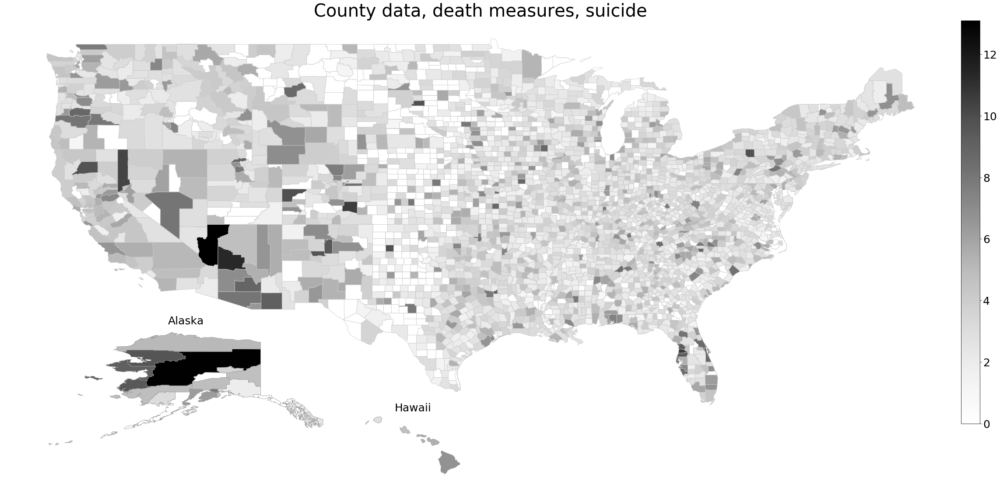

In [20]:
US_plot('Suicide', 'Greys')

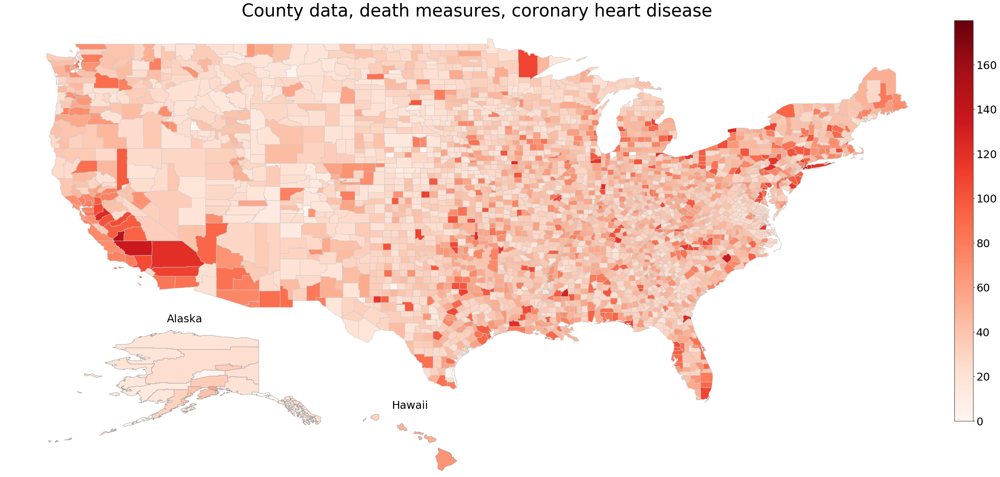

In [21]:
US_plot('CHD', 'Reds')

<div class="span5 alert alert-info">
    
## 2. Exploratory Data Analysis  <a class="anchor" id="EDA"></a>

<div class="span5 alert alert-info">
    
### 2.A. Measures of Birth and Death <a class="anchor" id="Measures"></a>

In [22]:
Birth_Death_list = list(np.intersect1d(df.columns, MEASURES_OF_BIRTH_AND_DEATH.columns))
Birth = []
Death = []
for i in Birth_Death_list:
    if i not in county_info:
        if description(i).__contains__('birth'):
            Birth.append(i)
        else:
            Death.append(i)

In [23]:
Death_Mean = {'Cause_of_Death':Death, 'Mean_Death':[np.mean(df[i]) for i in Death]}
Birth_Mean = {'Birth':Birth, 'Mean_Birth':[np.mean(df[i]) for i in Birth]}

df_death_mean = pd.DataFrame(Death_Mean)
df_death_mean = df_death_mean.drop(df_death_mean[df_death_mean['Cause_of_Death'] =='Total_Deaths'].index, axis=0)
df_death_mean = df_death_mean.sort_values(by=['Mean_Death'], ascending=False)

df_birth_mean = pd.DataFrame(Birth_Mean)
df_birth_mean = df_birth_mean.drop(df_birth_mean[df_birth_mean['Birth'] =='Total_Births'].index, axis=0)
df_birth_mean = df_birth_mean.sort_values(by=['Mean_Birth'], ascending=False)

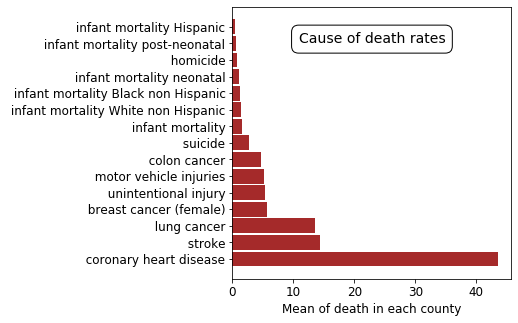

In [24]:
fig, ax = plt.subplots(1, figsize=(5, 5))
labels=list(short_description(i) for i in df_death_mean.Cause_of_Death)
plt.barh(labels, df_death_mean.Mean_Death, color='brown', height=0.9)
plt.xlabel('Mean of death in each county', fontsize=12)
plt.title('Cause of death rates', y=0.845, fontsize=14, 
          bbox=dict(facecolor='none', edgecolor='k', boxstyle='round,pad=0.5'))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

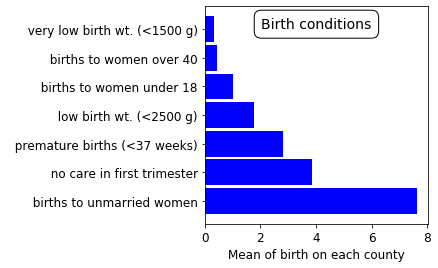

In [25]:
fig, ax = plt.subplots(1, figsize=(4, 4))
labels=list(short_description(i) for i in df_birth_mean.Birth)
plt.barh(labels, df_birth_mean.Mean_Birth, color='b', height=0.9)
plt.xlabel('Mean of birth on each county', fontsize=12)
plt.title('Birth conditions', y=0.872, fontsize=14,
         bbox=dict(facecolor='none', edgecolor='k', boxstyle='round,pad=0.5'))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [26]:
Death_race_list = list(np.intersect1d(df.columns, LEADING_CAUSES_OF_DEATH.columns))
Black = []
Hispanic = []
White = []
other = []
for i in Death_race_list:
    if i not in county_info:
        if description(i).__contains__('Black'):
            Black.append(i)
        elif description(i).__contains__('Hispanic'):
            Hispanic.append(i)
        elif description(i).__contains__('White'):
            White.append(i)
        else:
            other.append(i)
    

In [27]:
Black_up_24=[]
Black_25=[]
Hispanic_up_24=[]
Hispanic_25=[]
White_up_24=[]
White_25=[]
other_up_24=[]
other_25=[]
for i in Black:
    if description(i).__contains__('25-44') or description(i).__contains__('45-64') or description(i).__contains__('65+'):
        Black_25.append(i)
    else:
        Black_up_24.append(i)    
for i in Hispanic:
    if description(i).__contains__('25-44') or description(i).__contains__('45-64') or description(i).__contains__('65+'):
        Hispanic_25.append(i)
    else:
        Hispanic_up_24.append(i)
for i in White:
    if description(i).__contains__('25-44') or description(i).__contains__('45-64') or description(i).__contains__('65+'):
        White_25.append(i)
    else:
        White_up_24.append(i)            
for i in other:
    if description(i).__contains__('25-44') or description(i).__contains__('45-64') or description(i).__contains__('65+'):
        other_25.append(i)
    else:
        other_up_24.append(i) 

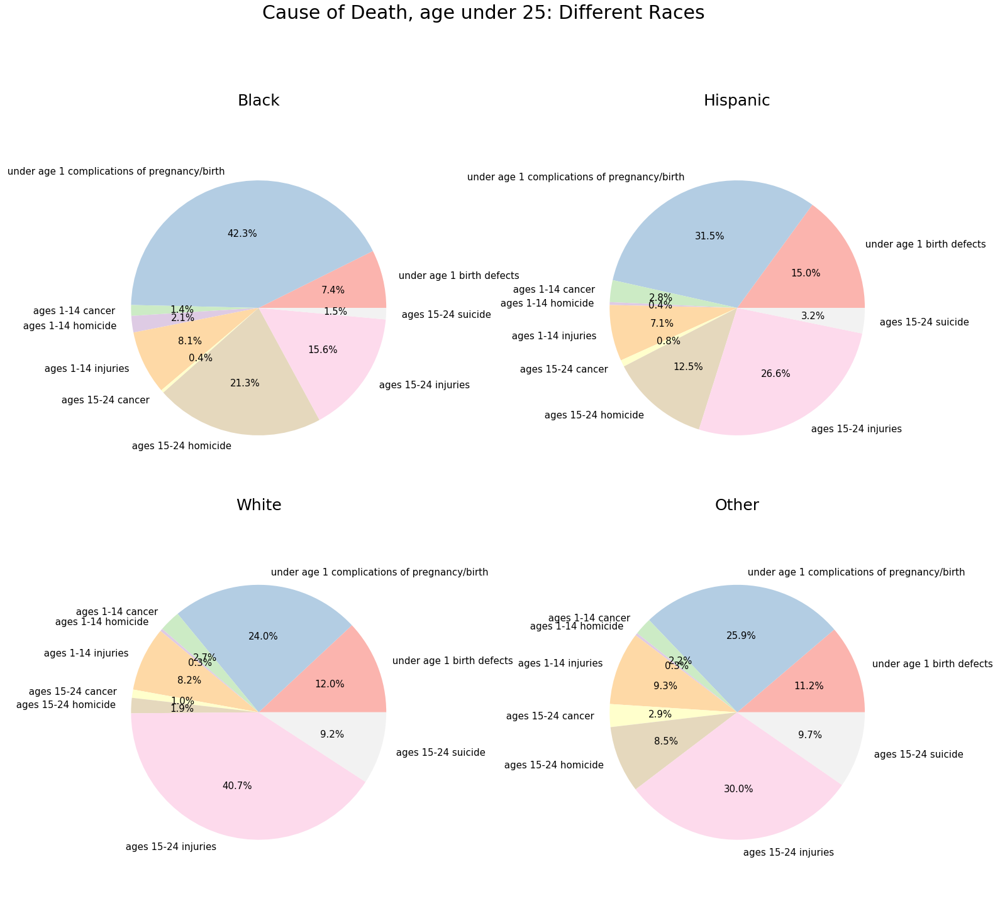

In [28]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(25, 25), sharey=True)
fig.subplots_adjust(hspace=-0.1)
cs=cm.Pastel1(np.arange(100))
mpl.rcParams['font.size'] = 15
fig.suptitle('Cause of Death, age under 25: Different Races', y=0.95, fontsize=30)
ax1.set_title('Black', fontsize=25)
labels=list(short_race_description(i) for i in Black_up_24)
ax1.pie(list(np.mean(df[i]) for i in Black_up_24),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax2.set_title('Hispanic', fontsize=25)
labels=list(short_race_description(i) for i in Hispanic_up_24)
ax2.pie(list(np.mean(df[i]) for i in Hispanic_up_24),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax3.set_title('White', fontsize=25)
labels=list(short_race_description(i) for i in White_up_24)
ax3.pie(list(np.mean(df[i]) for i in White_up_24),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax4.set_title('Other', fontsize=25)
labels=list(short_race_description(i) for i in other_up_24)
ax4.pie(list(np.mean(df[i])*2 for i in other_up_24),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

plt.show()

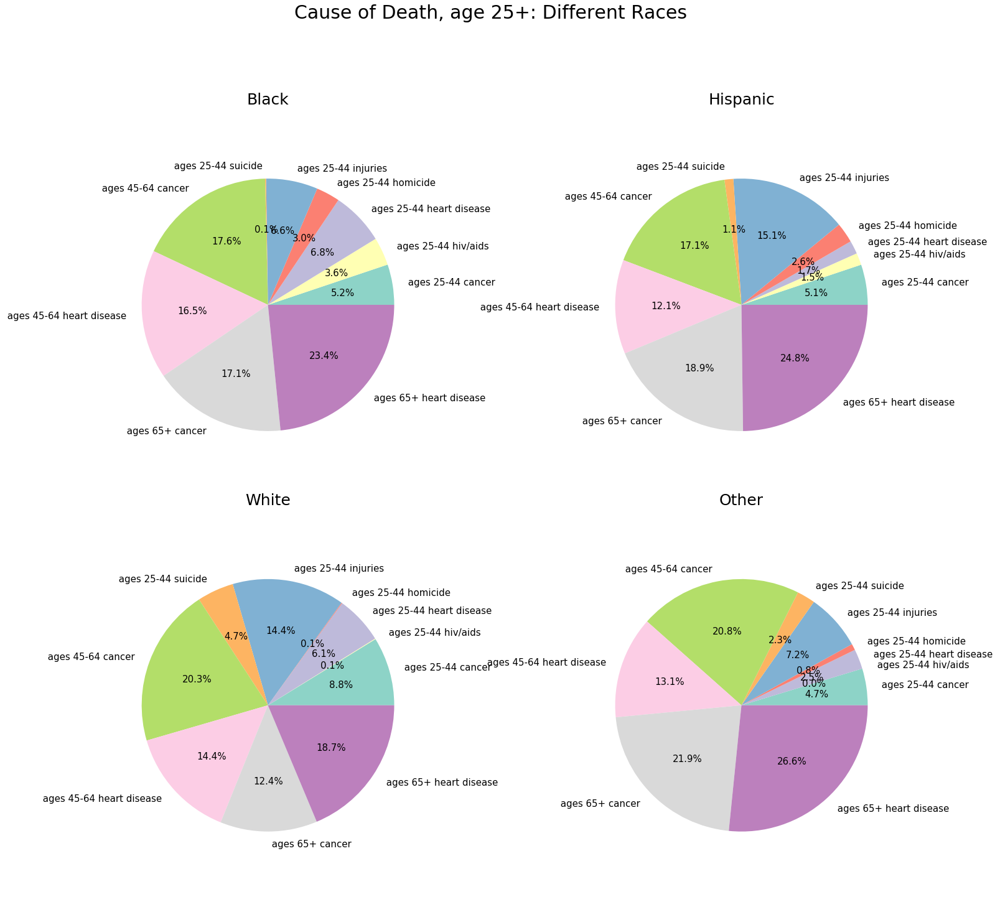

In [29]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(25, 25), sharey=True)
fig.subplots_adjust(hspace=-0.1)
cs=cm.Set3(np.arange(100))
mpl.rcParams['font.size'] = 15
fig.suptitle('Cause of Death, age 25+: Different Races', y=0.95, fontsize=30)
ax1.set_title('Black', fontsize=25)
labels=list(short_race_description(i) for i in Black_25)
ax1.pie(list(np.mean(df[i]) for i in Black_25),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax2.set_title('Hispanic', fontsize=25)
labels=list(short_race_description(i) for i in Hispanic_25)
ax2.pie(list(np.mean(df[i]) for i in Hispanic_25),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax3.set_title('White', fontsize=25)
labels=list(short_race_description(i) for i in White_25)
ax3.pie(list(np.mean(df[i]) for i in White_25),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

ax4.set_title('Other', fontsize=25)
labels=list(short_race_description(i) for i in other_25)
ax4.pie(list(np.mean(df[i]) for i in other_25),
        labels=labels, colors=cs, autopct='%1.1f%%', radius=0.8)

plt.show()

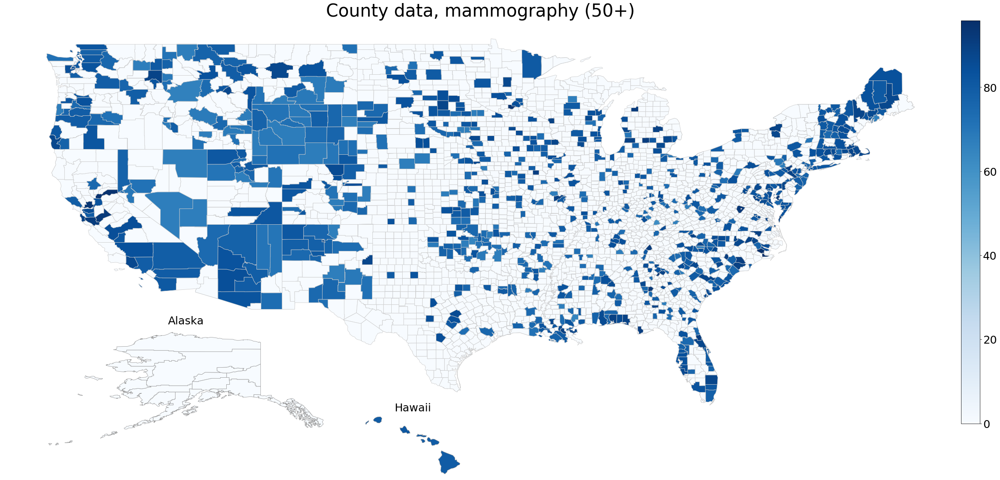

In [30]:
df.Mammogram
US_plot('Mammogram')

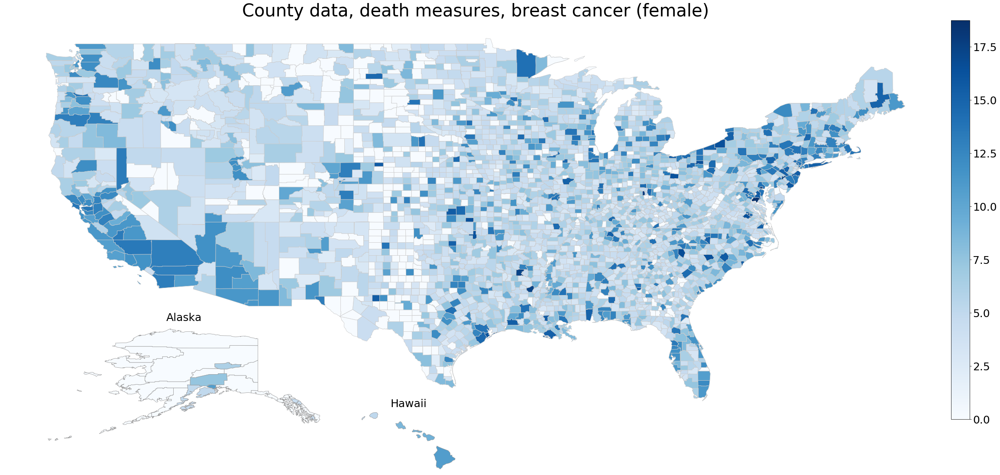

In [31]:
US_plot('Brst_Cancer')

<div class="span5 alert alert-info">
    
### 2.B. Correlated Variables <a class="anchor" id="Correlated"></a>

The following table shows the Pearson correlation between variables:

In [32]:
df.corr(method ='pearson') 

,Strata_ID_Number,Number_Counties,Population_Size,Population_Density,Poverty,Age_19_Under,Age_19_64,Age_65_84,Age_85_and_Over,White,...,Salm_Exp,Shig_Rpt,Shig_Exp,Toxic_Chem,Carbon_Monoxide_Ind,Nitrogen_Dioxide_Ind,Sulfur_Dioxide_Ind,Ozone_Ind,Particulate_Matter_Ind,Lead_Ind
Strata_ID_Number,1.000000,-0.016999,-0.385595,-0.185758,-0.310242,-0.367308,-0.387254,-0.410773,-0.397131,-0.402367,...,-0.465205,-0.297500,-0.419904,-0.155351,-0.793963,-0.795967,-0.795967,-0.683131,-0.770920,-0.793512
Number_Counties,-0.016999,1.000000,-0.085950,-0.031292,-0.069759,-0.081555,-0.085691,-0.095447,-0.094855,-0.089017,...,-0.107958,-0.062619,-0.088583,-0.068168,-0.128768,-0.129497,-0.129497,-0.104967,-0.129573,-0.126564
Population_Size,-0.385595,-0.085950,1.000000,0.335231,0.961705,0.996372,0.999554,0.980665,0.952200,0.989119,...,0.978261,0.523775,0.901652,0.204323,0.477616,0.477760,0.477760,0.522135,0.509329,0.475792
Population_Density,-0.185758,-0.031292,0.335231,1.000000,0.373577,0.299976,0.345055,0.354062,0.376061,0.280464,...,0.342724,0.277823,0.335209,0.039236,0.221469,0.222360,0.222360,0.195464,0.213169,0.221272
Poverty,-0.310242,-0.069759,0.961705,0.373577,1.000000,0.968263,0.958952,0.931286,0.900242,0.935962,...,0.926496,0.498817,0.877471,0.186449,0.380372,0.380109,0.380109,0.421159,0.416245,0.378296
Age_19_Under,-0.367308,-0.081555,0.996372,0.299976,0.968263,1.000000,0.994867,0.965763,0.931244,0.986382,...,0.970125,0.511967,0.894664,0.208503,0.455929,0.456193,0.456193,0.506404,0.493523,0.454306
Age_19_64,-0.387254,-0.085691,0.999554,0.345055,0.958952,0.994867,1.000000,0.978042,0.949148,0.988065,...,0.978266,0.523599,0.901414,0.203980,0.479766,0.479919,0.479919,0.524718,0.510393,0.477978
Age_65_84,-0.410773,-0.095447,0.980665,0.354062,0.931286,0.965763,0.978042,1.000000,0.985942,0.971911,...,0.968107,0.539076,0.893105,0.191325,0.505874,0.505606,0.505606,0.532761,0.528679,0.503397
Age_85_and_Over,-0.397131,-0.094855,0.952200,0.376061,0.900242,0.931244,0.949148,0.985942,1.000000,0.939691,...,0.942557,0.515929,0.865331,0.170557,0.489235,0.489309,0.489309,0.507211,0.504959,0.486869
White,-0.402367,-0.089017,0.989119,0.280464,0.935962,0.986382,0.988065,0.971911,0.939691,1.000000,...,0.967864,0.496013,0.884924,0.203306,0.496350,0.497269,0.497269,0.539502,0.533751,0.495438


Well, this is too much information about our big dataframe! To know about the important  correlated variables we need more cleaning;

I'll make another small dataframe with 3 columns: column one and two--> correlated pairs and column 3 the magnitude of their correlations. To make it easier to see the highly correlated parameters I sort them. I also defined a threshold=0.7 to cut low-correlated ones. 

In [33]:
not_helping_columns = ['Sulfur_Dioxide_Ind', 
                       'Nitrogen_Dioxide_Ind', 'Lead_Ind', 'Carbon_Monoxide_Ind', 'Particulate_Matter_Ind', 'Time']
#The function of making dataframes with different thresholds of correlations 
def func_df_corr(threshold):
    threshold = threshold
    attrs = df.drop(columns=not_helping_columns).corr()
    high_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()
    df_corrs = pd.DataFrame(list((sorted(key)[0], sorted(key)[1], high_corrs[key]) for key in high_corrs),
                            columns=['attribute_1','attribute_2', 'correlation'])
    df_corrs = df_corrs.iloc[abs(df_corrs['correlation']).argsort()[::-1]].drop_duplicates().reset_index(drop=True)
    return df_corrs

df_corrs = func_df_corr(0.6)
df_corrs.head(20)

,attribute_1,attribute_2,correlation
0,Age_19_64,Population_Size,0.999554
1,Age_65_84,Elderly_Medicare,0.997419
2,Age_19_Under,Total_Births,0.997241
3,Age_19_Under,Population_Size,0.996372
4,Age_19_64,Age_19_Under,0.994867
5,Age_19_64,Major_Depression,0.994330
6,Major_Depression,Population_Size,0.993877
7,Population_Size,Total_Births,0.993762
8,Pert_Exp,Population_Size,0.993672
9,Age_19_64,Pert_Exp,0.993333


Alright! It looks better!

In [34]:
# If we want to make a df with tuples of correlated pairs:
# df_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), high_corrs [key])
#                                   for key in high_corrs])), columns=['attribute_pair', 'correlation'])

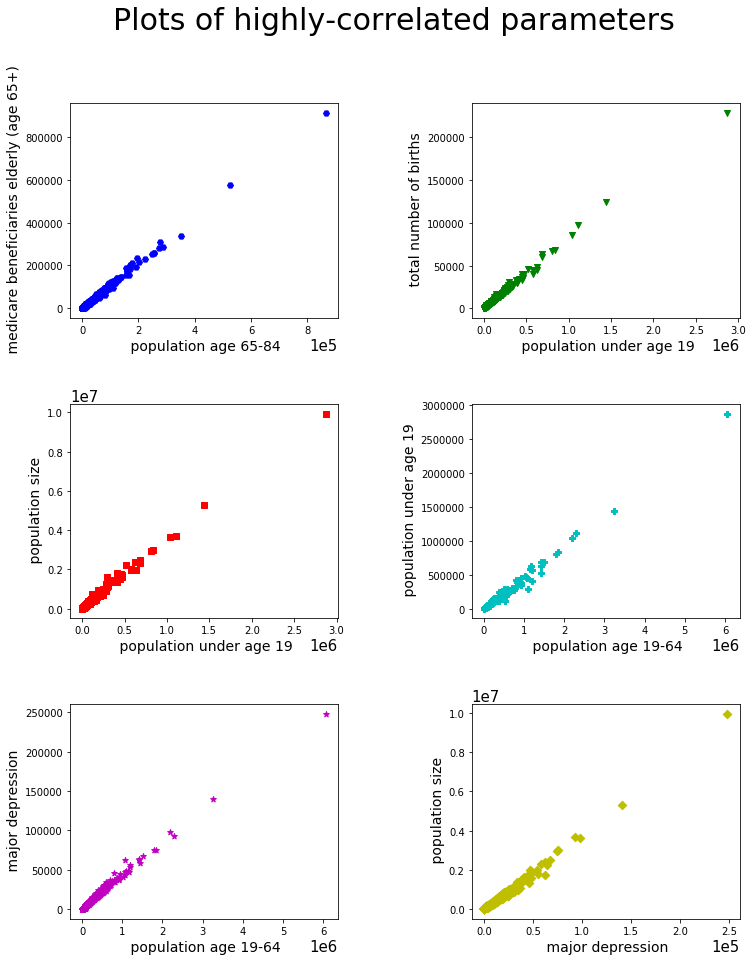

In [35]:
#Here we plot the top 6 most correlated parameters:
colors = ['b', 'g', 'r', 'c', 'm', 'y']
markers = ['H', 'v', 's', 'P', '*', 'D']
fig, axs = plt.subplots(3,2, figsize=(12,15), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('Plots of highly-correlated parameters', y=0.97, fontsize=30)
axs = axs.ravel()

for i in range(6):
    axs[i].scatter(df[df_corrs.loc[i+1,'attribute_1']], df[df_corrs.loc[i+1,'attribute_2']], 
                   marker=markers[i], color=colors[i])
    axs[i].set_xlabel(short_description(df_corrs.loc[i+1,'attribute_1']), fontsize=14)
    axs[i].set_ylabel(short_description(df_corrs.loc[i+1,'attribute_2']), fontsize=14)
    axs[i].xaxis.get_major_formatter().set_powerlimits((0, 1))
    axs[i].tick_params(axis='both', labelsize=10)
    axs[i].tick_params(axis='y', labelsize=10)

In [36]:
for i in Death:
    print(df_corrs[df_corrs['attribute_1']==i].head(10))

     attribute_1    attribute_2  correlation
282  Brst_Cancer    E_Wh_Cancer     0.886133
297  Brst_Cancer    F_Wh_Cancer     0.880687
306  Brst_Cancer     Col_Cancer     0.876601
321  Brst_Cancer      Premature     0.871133
326  Brst_Cancer            LBW     0.866469
327  Brst_Cancer    Lung_Cancer     0.865634
332  Brst_Cancer  F_Wh_HeartDis     0.863822
341  Brst_Cancer  E_Wh_HeartDis     0.859256
380  Brst_Cancer           VLBW     0.831433
382  Brst_Cancer         Stroke     0.831162
    attribute_1    attribute_2  correlation
208         CHD  F_Wh_HeartDis     0.935667
257         CHD  E_Wh_HeartDis     0.899126
293         CHD    Lung_Cancer     0.883059
310         CHD      Premature     0.875345
338         CHD            LBW     0.859882
363         CHD     Col_Cancer     0.843544
371         CHD    F_Wh_Cancer     0.835635
402         CHD      Unmarried     0.820675
406         CHD    E_Wh_Cancer     0.818792
417         CHD           VLBW     0.812496
    attribute_1    at

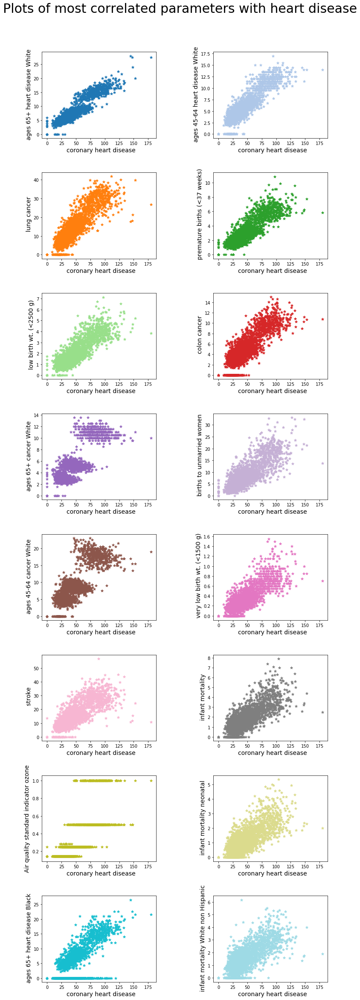

In [37]:
#Now the most correlated parameters with heart diseas:
num_plots = 16
colors = cm.tab20(np.linspace(0, 1, num_plots))
fig, axs = plt.subplots(int(num_plots/2),2, figsize=(12,40), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('Plots of most correlated parameters with heart disease', y=0.92, fontsize=30)
axs = axs.ravel()

corr_params = list(df_corrs[df_corrs['attribute_1']=='CHD']['attribute_2'])
for i in range(num_plots):
    axs[i].scatter(df['CHD'], df[corr_params[i]], 
                   marker='*', color=colors[i])
    axs[i].set_xlabel(short_description('CHD'), fontsize=14)
    axs[i].set_ylabel(short_description(corr_params[i]), fontsize=14)
    axs[i].tick_params(axis='x', labelsize=10)
    axs[i].tick_params(axis='y', labelsize=10)

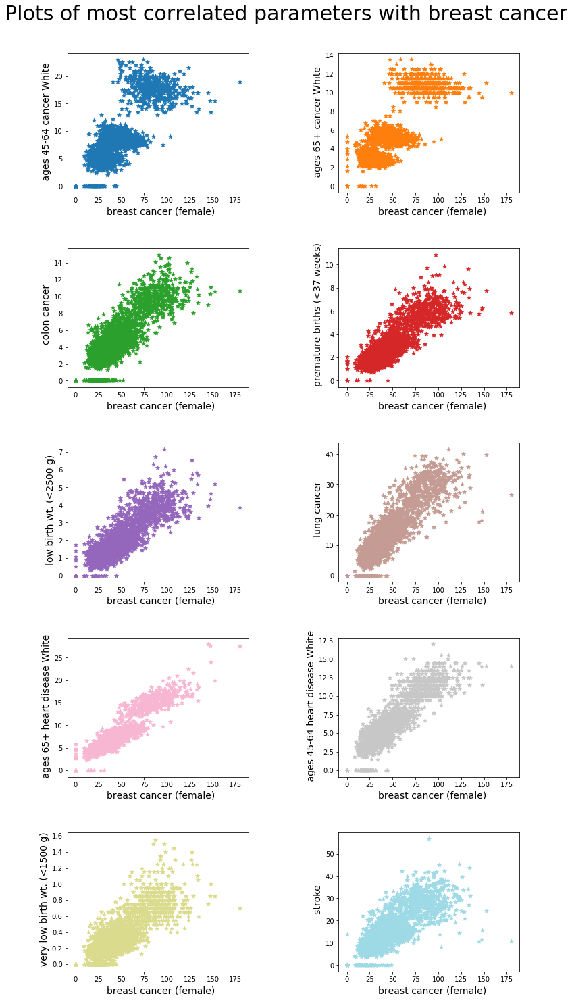

In [38]:
#Now the most correlated parameters with breast cancer:
num_plots = 10
colors = cm.tab20(np.linspace(0, 1, num_plots))
fig, axs = plt.subplots(int(num_plots/2),2, figsize=(12,25), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('Plots of most correlated parameters with breast cancer', y=0.92, fontsize=30)
axs = axs.ravel()

corr_params = list(df_corrs[df_corrs['attribute_1']=='Brst_Cancer']['attribute_2'])
for i in range(num_plots):
    axs[i].scatter(df['CHD'], df[corr_params[i]], 
                   marker='*', color=colors[i])
    axs[i].set_xlabel(short_description('Brst_Cancer'), fontsize=14)
    axs[i].set_ylabel(short_description(corr_params[i]), fontsize=14)
    axs[i].tick_params(axis='x', labelsize=10)
    axs[i].tick_params(axis='y', labelsize=10)


Okk! Correlated parameters are great and can be discussed in statistical inference section. 
Now how about looking at the data from States point of view: 

In [39]:
#A new dataframe based on States:
df_state = df.groupby('CHSI_State_Abbr').sum().reset_index() 
df_state.head()

,CHSI_State_Abbr,Strata_ID_Number,Number_Counties,Population_Size,Population_Density,Poverty,Age_19_Under,Age_19_64,Age_65_84,Age_85_and_Over,...,Salm_Exp,Shig_Rpt,Shig_Exp,Toxic_Chem,Carbon_Monoxide_Ind,Nitrogen_Dioxide_Ind,Sulfur_Dioxide_Ind,Ozone_Ind,Particulate_Matter_Ind,Lead_Ind
0,AK,1957,946,663661,213.0,65368.351,1.998699e+05,4.197725e+05,39997.486,3877.045,...,118.857143,26.821429,61.107143,8.371644e+07,4.642857,4.642857,4.642857,4.642857,4.642857,4.642857
1,AL,2745,2489,4557808,5736.0,694294.921,1.153972e+06,2.800757e+06,535624.455,67868.741,...,971.142857,609.821429,555.357143,4.291972e+07,16.857143,16.357143,16.357143,18.357143,16.357143,16.357143
2,AR,3993,2753,2779154,3877.0,445173.431,7.149351e+05,1.679779e+06,336098.748,48514.192,...,589.821429,359.500000,269.000000,1.140120e+07,14.500000,14.500000,14.500000,15.250000,14.500000,14.500000
3,AZ,513,491,5939292,714.0,825628.417,1.657401e+06,3.522749e+06,668126.071,90995.793,...,945.000000,869.000000,645.071429,1.833658e+07,5.285714,5.285714,5.285714,6.535714,6.535714,5.285714
4,CA,1201,2174,36132147,36531.0,4975547.123,1.018251e+07,2.207879e+07,3327178.717,544400.788,...,5618.250000,0.000000,3304.464286,2.311464e+07,22.285714,22.285714,22.285714,35.821429,25.571429,22.285714


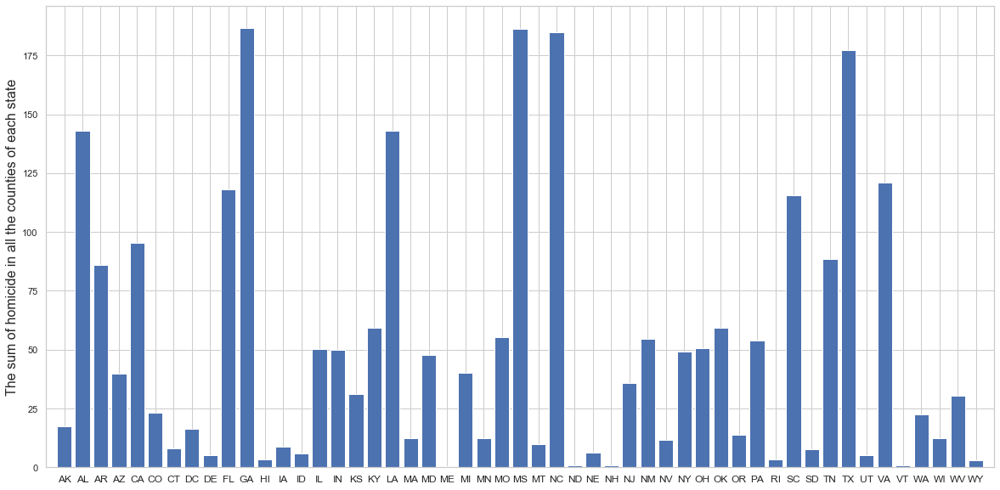

In [40]:
sns.set(style='whitegrid')
fig, ax = plt.subplots(1, figsize=(20, 10))
plt.bar(df_state['CHSI_State_Abbr'], df_state['Homicide'], color='b')
plt.xlim(-1, len(df_state.index))
plt.ylabel('The sum of homicide in all the counties of each state', fontsize=16)
plt.xticks(fontsize=12)
plt.show()


<div class="span5 alert alert-info">
    
### 2.C. Demographics Map --States <a class="anchor" id="Demographics-States"></a>

In [41]:
sns.reset_defaults()
us_state = gpd.read_file('../US-States/states.shp')
us_state_land = us_state[ (us_state['STATE_NAME']!='Alaska') 
                     &(us_state['STATE_NAME']!='Hawaii')]
us_state_Alaska = us_state[us_state['STATE_NAME']=='Alaska']
us_state_Hawaii = us_state[us_state['STATE_NAME']=='Hawaii']
us_state.head()

#Merging map and data:
df_state_land = us_state_land.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Alaska = us_state_Alaska.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Hawaii = us_state_Hawaii.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))

def min_max_col2(variable):
    minimum = min(df_state_land[variable].min(), 
              df_state_Alaska[variable].min(), df_state_Hawaii[variable].min())
    maximum = max(df_state_land[variable].max(), 
              df_state_Alaska[variable].max(), df_state_Hawaii[variable].max())
    return minimum, maximum

def US_state_plot(variable, color='Blues'):
    h, w = figaspect(1.)
    mn, mx = min_max_col2(variable)
    fig, ax1 = plt.subplots(1, figsize=(w*10, h*10))
    ax1.axis('off')
    ax1.set_title(short_description(variable), fontsize=40)
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='2%', pad=0.1)
    cax.tick_params(labelsize=25)
    df_state_land.plot(column=variable, cmap=color,
                        linewidth=0.8, ax=ax1,
                        edgecolor='0.8', vmin=mn ,vmax=mx,
                        legend=True, cax=cax)

    
    left, bottom, width, height = [0.15, 0.22, 0.24, 0.3] 
    ax2 = fig.add_axes([left, bottom, width, height])
    ax2.axis('off')
    ax2.set_title('Alaska', fontsize=25)
    df_state_Alaska.plot(column=variable, cmap=color, vmin=mn ,vmax=mx,
                          linewidth=0.8, ax=ax2, edgecolor='0.6')
    
    left, bottom, width, height = [0.35, 0.3, 0.2, 0.05]
    ax3 = fig.add_axes([left, bottom, width, height])
    ax3.axis('off')
    ax3.set_title('Hawaii', fontsize=25)
    df_state_Hawaii.plot(column =variable, cmap=color, vmin=mn ,vmax=mx,
                          linewidth=0.8, ax=ax3, edgecolor='0.6')


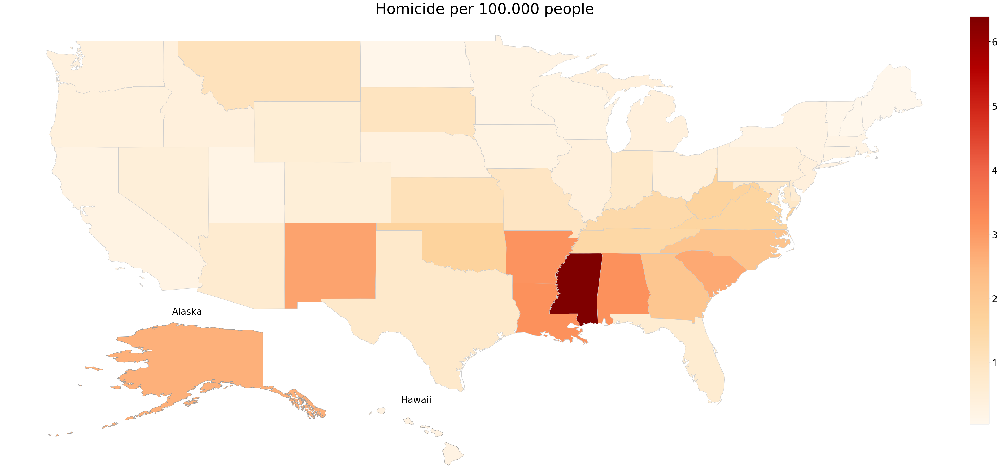

In [42]:
df_state_land['Homicide_per_capita'] = df_state_land['Homicide'].div(df_state_land['Population_Size'])*100000
df_state_Alaska['Homicide_per_capita'] = df_state_Alaska['Homicide'].div(df_state_Alaska['Population_Size'])*100000
df_state_Hawaii['Homicide_per_capita'] = df_state_Hawaii['Homicide'].div(df_state_Hawaii['Population_Size'])*100000
new_item = pd.DataFrame({'COLUMN_NAME':['Homicide_per_capita'], 'DESCRIPTION':['Homicide per 100.000 people']})
DATA_ELEMENT_DESCRIPTION = DATA_ELEMENT_DESCRIPTION.append(new_item, sort=False)

US_state_plot('Homicide_per_capita', 'OrRd')


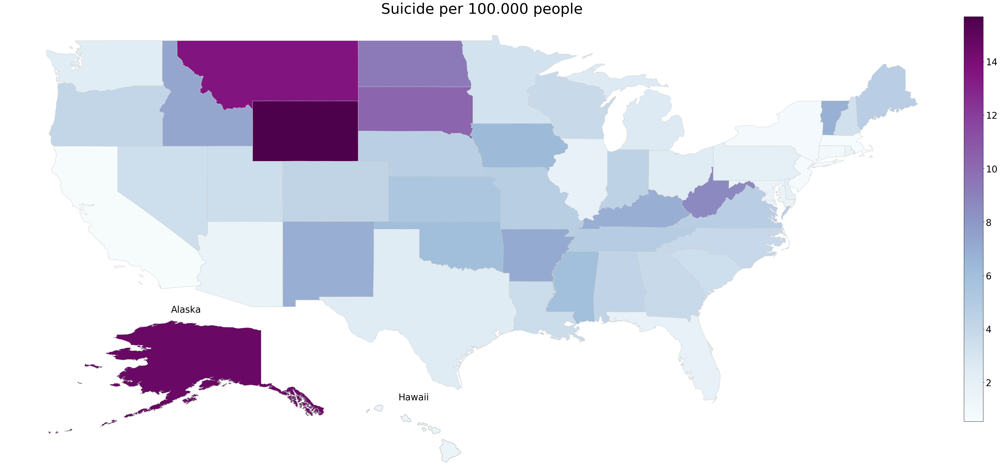

In [43]:
df_state_land['Suicide_per_capita'] = df_state_land['Suicide']/df_state_land['Population_Size']*100000
df_state_Alaska['Suicide_per_capita'] = df_state_Alaska['Suicide']/df_state_Alaska['Population_Size']*100000
df_state_Hawaii['Suicide_per_capita'] = df_state_Hawaii['Suicide']/df_state_Hawaii['Population_Size']*100000
new_item = pd.DataFrame({'COLUMN_NAME':['Suicide_per_capita'], 'DESCRIPTION':['Suicide per 100.000 people']})
DATA_ELEMENT_DESCRIPTION = DATA_ELEMENT_DESCRIPTION.append(new_item, sort=False)


US_state_plot('Suicide_per_capita', 'BuPu')


(0, 6709031.725179751)

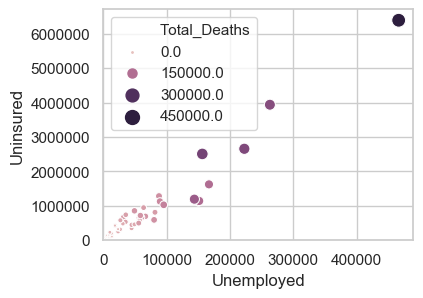

In [44]:
#Relationship between total death, being unmarried and being uninsured:
sns.set(style='whitegrid')
fig, ax = plt.subplots(1, figsize=(4, 3))
cmap = sns.cubehelix_palette(light=0.8, as_cmap=True)
ax = sns.scatterplot(x='Unemployed', y='Uninsured', size='Total_Deaths', hue='Total_Deaths', 
                     sizes=(1, 100), palette=cmap, data=df_state)
ax.set_xlim(0)
ax.set_ylim(0)

In [79]:
sns.reset_orig()

Text(0, 0.5, 'Infant Mortality')

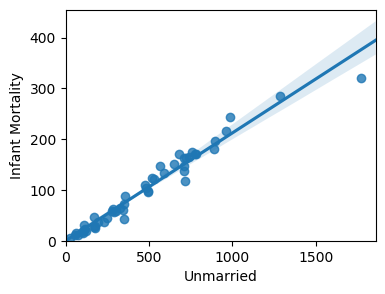

In [77]:
f, ax = plt.subplots(figsize=(4, 3))
ax = sns.regplot(x='Unmarried', y='Infant_Mortality', data=df_state)
ax.set(ylim=(0, None))
ax.set(xlim=(0, None))
ax.set_ylabel('Infant Mortality')

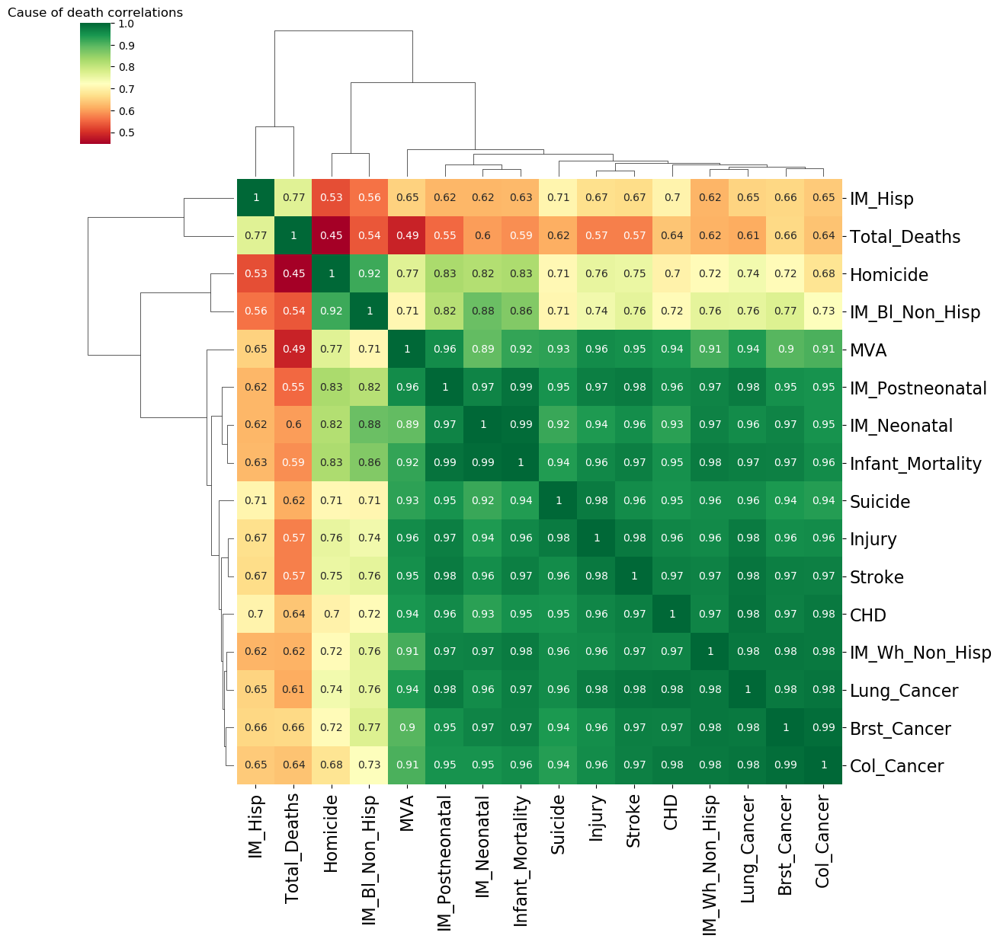

In [47]:
g = sns.clustermap(df_state[Death].corr(method='pearson'),cmap='RdYlGn', 
                   annot=True, annot_kws={'size': 10}, figsize=(5,5))
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 16)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 16)
plt.subplots_adjust(left=0, bottom=-1, right=2, top=1, wspace=0, hspace=0)
plt.title('Cause of death correlations')
plt.show()

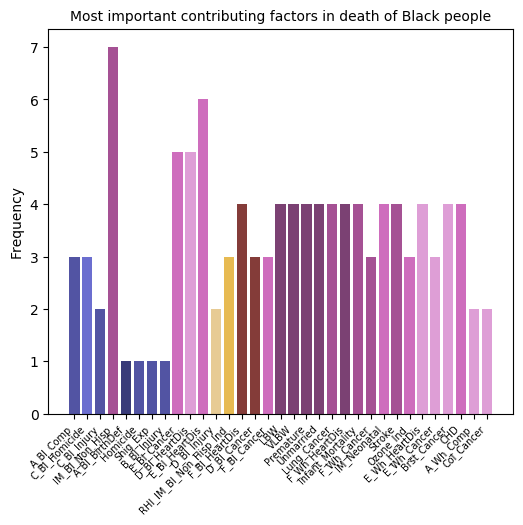

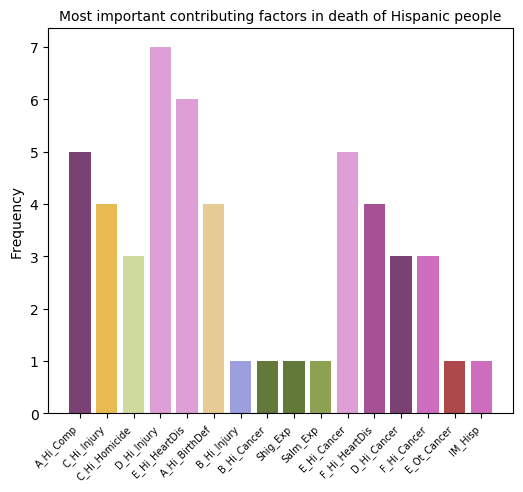

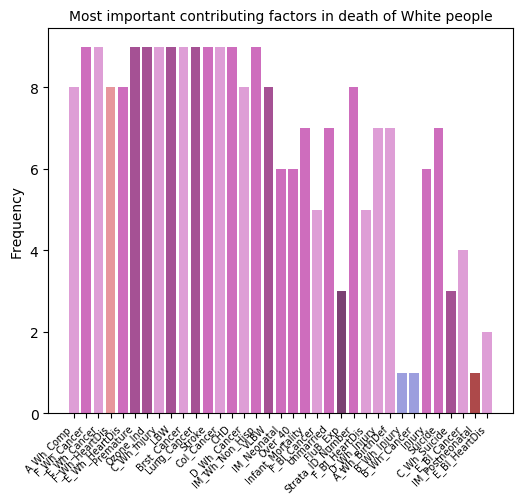

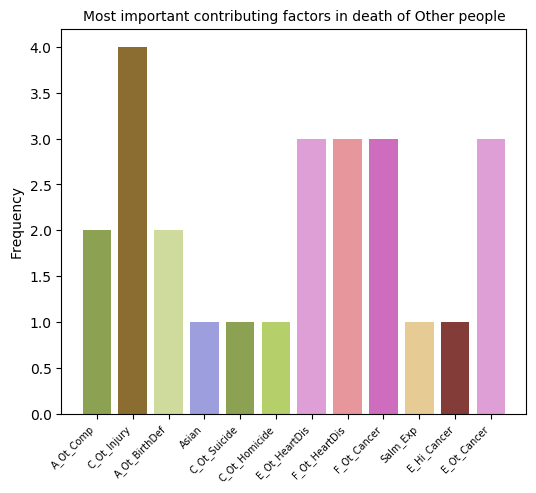

In [78]:
list_of_races = [Black, Hispanic, White, other]
names = ['Black', 'Hispanic', 'White', 'Other']
for n, races in enumerate(list_of_races):
    x=[]
    for i in races:
        x= [*x, 
            *(func_df_corr(0.65)[func_df_corr(0.65)['attribute_1']==i]['attribute_2']),
            *(func_df_corr(0.65)[func_df_corr(0.65)['attribute_2']==i]['attribute_1'])] 
    colors = iter(cm.tab20b(np.linspace(0, 1, len(x))))
    plt.subplots(1, figsize=(6, 5))
    for j in x:
        plt.bar(j, x.count(j), color=next(colors))
        plt.setp(plt.gca().get_xticklabels(),fontsize=7, rotation=45, horizontalalignment='right')
        plt.ylabel('Frequency')
    plt.title('Most important contributing factors in death of '+str(names[n])+' people', fontsize=10)
    plt.show()     


<div class="span5 alert alert-info"> 

## 3. Final DataFrame <a class="anchor" id="df_final"></a>

After exploratory data analysis, we have a good insight about the data, important parameters and how they are related to each other. It's time to make a final dataframe to work with. Then, with this dataframe we are going to perform statistical analysis:

In [49]:
important_parameters= [*list(np.intersect1d(df.columns, RISK_FACTORS_AND_ACCESS_TO_CARE.columns)),
*list(np.intersect1d(df.columns, VULNERABLE_POPS_AND_ENV_HEALTH.columns)),
*list(np.intersect1d(df.columns, PREVENTIVE_SERVICES_USE.columns)),
*list(np.intersect1d(df.columns, MEASURES_OF_BIRTH_AND_DEATH.columns)),
*list(np.intersect1d(df.columns, DEMOGRAPHICS.columns)),                       
*list(np.intersect1d(df.columns, LEADING_CAUSES_OF_DEATH.columns))]

df_final = df[np.unique(important_parameters)].drop_duplicates().reset_index(drop=True)
df_final.drop(not_helping_columns, axis=1, inplace=True)


*One more step*:

If more than 2/3 of the values in a column is zero (or not reported) it would not be helpful and perhaps makes more trouble. We need to get rid of them:

In [50]:
for i in list(df_final.columns):
    num_zero = list(df_final[i]).count(0)
    if num_zero > 2000:
        df_final.drop(i, axis=1, inplace=True)
df_final.head()      

,Age_19_64,Age_19_Under,Age_65_84,Age_85_and_Over,Asian,Black,Brst_Cancer,CHD,CHSI_County_Name,CHSI_State_Abbr,...,Syphilis_Rpt,Total_Births,Total_Deaths,Toxic_Chem,Under_18,Unemployed,Uninsured,Unmarried,VLBW,White
0,30285.276,13076.628,4763.976,437.508,291.672,8409.876,8.525,43.100000,Autauga,AL,...,2.000000,762.000000,466.750000,720799.250000,1.275000,193.500000,5690.0,7.000000,0.400000,39229.884
1,98039.358,38207.710,23574.970,2926.548,650.344,16096.014,11.250,78.250000,Baldwin,AL,...,0.000000,2735.500000,2194.000000,17832.000000,2.150000,1266.500000,19798.0,12.700000,0.950000,143726.024
2,17758.750,6904.602,3296.024,454.624,85.242,13297.752,7.625,23.825000,Barbour,AL,...,1.500000,458.750000,384.500000,12468.500000,1.925000,142.250000,5126.0,12.550000,0.475000,14832.108
3,13619.628,5292.936,2345.244,258.192,21.516,4841.100,4.300,26.385714,Bibb,AL,...,0.285714,400.142857,287.428571,1043.142857,0.928571,51.142857,3315.0,4.314286,0.242857,16524.288
4,34605.225,13652.625,6742.725,724.425,111.450,835.875,7.550,37.050000,Blount,AL,...,0.000000,829.500000,613.250000,222255.000000,1.250000,204.750000,8131.0,4.825000,0.375000,54108.975


In [51]:
#Rearranging the columns so the name of counties and states are the fist:
county_info_2 = ['CHSI_County_Name', 'CHSI_State_Abbr', 'CHSI_State_Name']
cols =  list(set(df_final.columns.tolist()) - set(county_info_2))
df_final = df_final.reindex(columns = county_info_2 + cols)
df_final.head()

,CHSI_County_Name,CHSI_State_Abbr,CHSI_State_Name,Premature,Homicide,E_Wh_Cancer,Suicide,IM_Wh_Non_Hisp,E_Bl_Cancer,IM_Postneonatal,...,Over_40,Total_Births,Unmarried,Under_18,D_Wh_Cancer,Shig_Rpt,F_Wh_Cancer,Black,Prim_Care_Phys_Rate,Hispanic
0,Autauga,AL,Alabama,3.575000,1.675000,9.000000,4.150000,1.050000,5.750000,0.750000,...,0.350000,762.000000,7.000000,1.275000,0.000000,1.000000,5.000000,8409.876,45.3,826.404
1,Baldwin,AL,Alabama,7.650000,2.700000,18.500000,7.150000,2.850000,14.000000,0.750000,...,0.950000,2735.500000,12.700000,2.150000,5.500000,20.500000,11.500000,16096.014,67.0,3739.478
2,Barbour,AL,Alabama,4.175000,2.950000,7.750000,2.575000,1.375000,6.500000,0.400000,...,0.275000,458.750000,12.550000,1.925000,5.250000,0.250000,5.000000,13297.752,45.8,880.834
3,Bibb,AL,Alabama,1.957143,1.142857,4.714286,2.114286,1.314286,4.142857,0.385714,...,0.128571,400.142857,4.314286,0.928571,2.285714,0.428571,2.571429,4841.100,41.8,301.224
4,Blount,AL,Alabama,3.200000,1.325000,9.250000,3.600000,1.875000,0.000000,0.900000,...,0.325000,829.500000,4.825000,1.250000,4.000000,2.750000,5.000000,835.875,16.2,3510.675


In [52]:
#df_final.to_csv(r'C:\Users\shiva\Desktop\export_dataframe.csv', index=False)

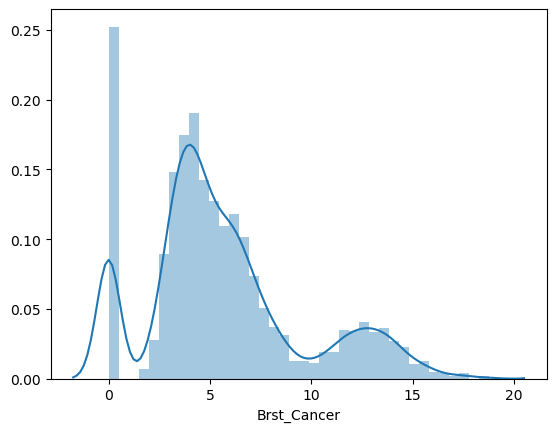

In [53]:
sns.distplot(df_final['Brst_Cancer'])

<div class="span5 alert alert-info"> 

## 4. Modeling <a class="anchor" id="Modeling"></a>

<div class="span5 alert alert-info">
    
### 4.A. Breast Cancer: Fitting Linear Regression using `sklearn` <a class="anchor" id="Brst_Cancer_Reg"></a>

With linear regression, we want to predict the breast cancer and also find a list of important contributing parameters: 

In [54]:
from sklearn.linear_model import LinearRegression
drop_list = [*county_info_2,'Brst_Cancer']
X = df_final.drop(columns=drop_list, axis=1)
y = df_final['Brst_Cancer']
lm = LinearRegression()
lm.fit(X, y)
print('Estimated intercept coefficient: {}'.format(lm.intercept_))
print('Number of coefficients: {}'.format(len(lm.coef_)))

Estimated intercept coefficient: 0.2763334173449765
Number of coefficients: 85


In [55]:
Brst_cancer_coefs = pd.DataFrame({'features': X.columns, 'estimatedCoefficients': lm.coef_})\
[['features', 'estimatedCoefficients']]
Brst_cancer_coefs.head(10)

,features,estimatedCoefficients
0,Premature,0.080974
1,Homicide,0.147487
2,E_Wh_Cancer,0.190968
3,Suicide,0.082853
4,IM_Wh_Non_Hisp,0.019801
5,E_Bl_Cancer,-0.012675
6,IM_Postneonatal,0.503366
7,Injury,-0.008069
8,Few_Fruit_Veg,0.000540
9,Stroke,0.001882


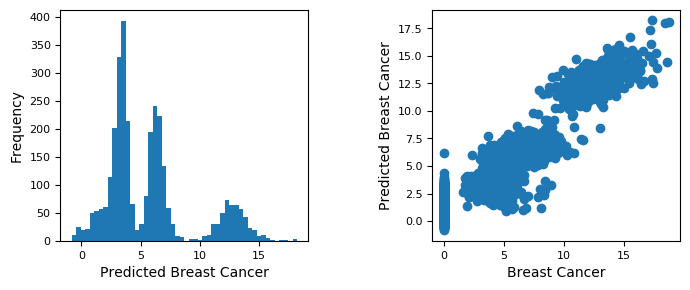

In [56]:
fig, axs = plt.subplots(1,2, figsize=(8, 3))
fig.subplots_adjust(hspace=0.4, wspace=0.5)
axs = axs.ravel()

axs[0].hist(lm.predict(X), bins=50)
axs[0].set_xlabel('Predicted Breast Cancer', fontsize=10)
axs[0].set_ylabel('Frequency', fontsize=10)
axs[0].tick_params(axis='both', labelsize=8)

axs[1].scatter(df_final['Brst_Cancer'], lm.predict(X))
axs[1].set_xlabel('Breast Cancer', fontsize=10)
axs[1].set_ylabel('Predicted Breast Cancer', fontsize=10)
axs[1].tick_params(axis='both', labelsize=8)
plt.show()

Now let's see how the model looks like if we only take into account the important contributing parameters:

In [57]:
contributing_params = list(Brst_cancer_coefs[abs(Brst_cancer_coefs['estimatedCoefficients'])>0.2]['features'])
contributing_params

['IM_Postneonatal', 'IM_Neonatal', 'VLBW', 'Col_Cancer', 'Infant_Mortality']

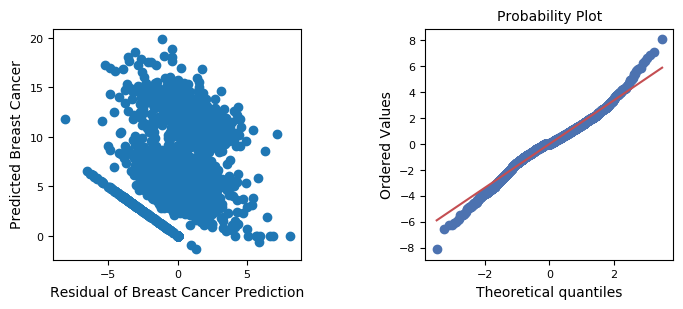

In [58]:
X = df_final.filter(items=contributing_params)
y = df_final['Brst_Cancer']
lm.fit(X, y)
residual = y - lm.predict(X)

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8, 3))
fig.subplots_adjust(hspace=0.4, wspace=0.5)
ax1.scatter(residual, lm.predict(X))
ax1.set_xlabel('Residual of Breast Cancer Prediction', fontsize=10)
ax1.set_ylabel('Predicted Breast Cancer', fontsize=10)
sp.stats.probplot(residual, plot=ax2, fit=True)
ax1.tick_params(axis='both', labelsize=8)
ax2.tick_params(axis='both', labelsize=8)
ax2.set_xlabel('Theoretical quantiles',fontsize=10)
ax2.set_ylabel('Ordered Values',fontsize=10)
ax2.set_title('Probability Plot',fontsize=10)

plt.show()

<div class="span5 alert alert-info">
    
### 4.B. Breast Cancer: Unsupervised Clustering <a class="anchor" id="Brst_Cancer_Clustering"></a>

The Elbow Sum-of-Squares Method. 

In order to find patterns of Breast Cancer in our dataframe, here we perform K-Means clustering method. First, we should know how many cluster is needed to find the trend:

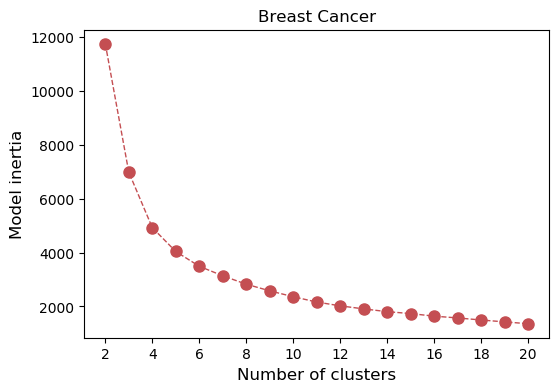

In [59]:
SS = []
x_cols = X.values
K = range(2,21)
for i in K:
    model = KMeans(n_clusters=i, random_state=22)
    model.fit(x_cols)
    SS.append(model.inertia_)

plt.rcParams['figure.figsize'] = (6,4)   
plt.plot(K, SS, 'ro--', linewidth=1, markersize=8)
plt.xlabel('Number of clusters', fontsize=12)
plt.xticks(np.arange(2, 21, step=2), fontsize=10)
plt.ylabel('Model inertia', fontsize=12)
plt.yticks(fontsize=10)
plt.title('Breast Cancer')
plt.show()    
    

Seems like 6 is the best number (more than that we would make unnecessary clusters)!

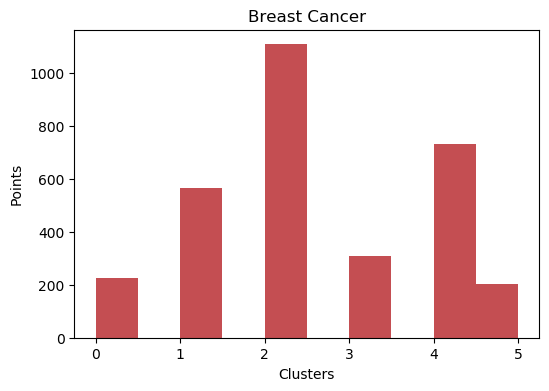

In [60]:
model = KMeans(n_clusters = 6, random_state=22)
model.fit(x_cols)
labels = model.predict(X)
plt.hist(labels, bins=10, color='r')
plt.xlabel('Clusters')
plt.ylabel('Points')
plt.title('Breast Cancer')
plt.show()

Let's check this with silhouette method:

For n_clusters = 2 The average silhouette_score is : 0.6188466651143338


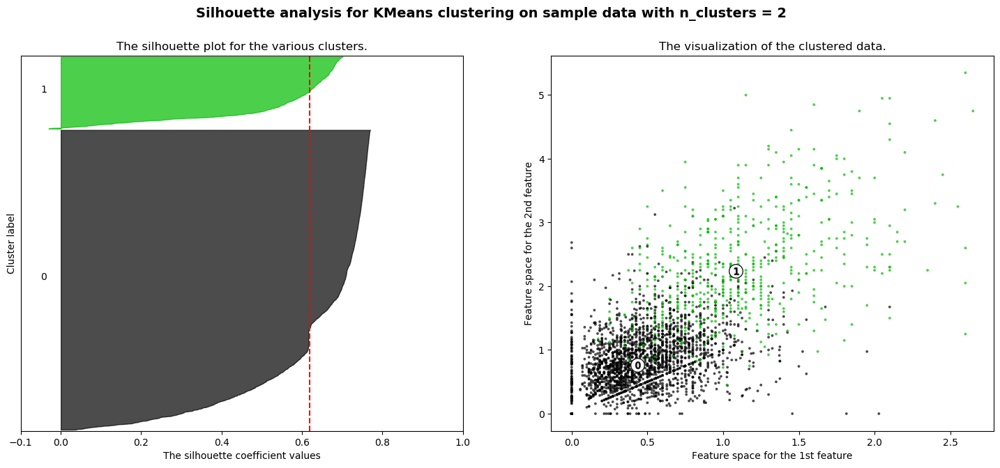

For n_clusters = 3 The average silhouette_score is : 0.4447200078914541


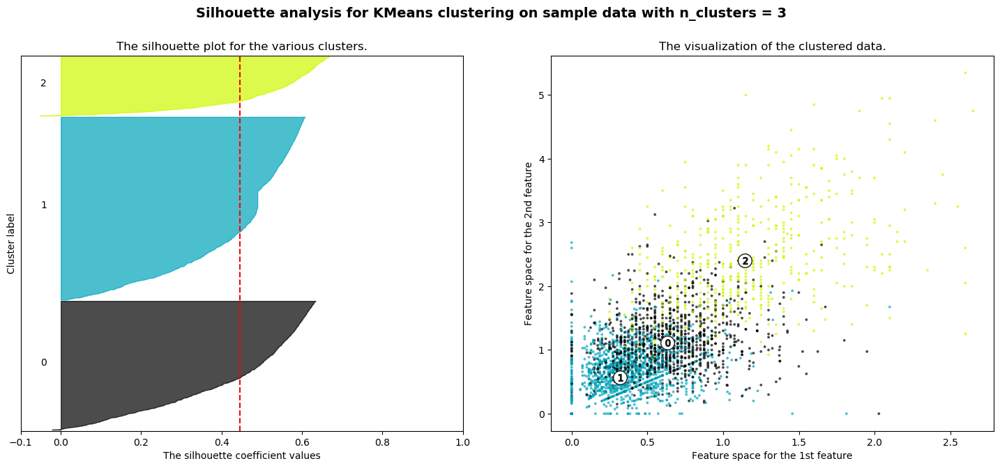

For n_clusters = 4 The average silhouette_score is : 0.4872010506091525


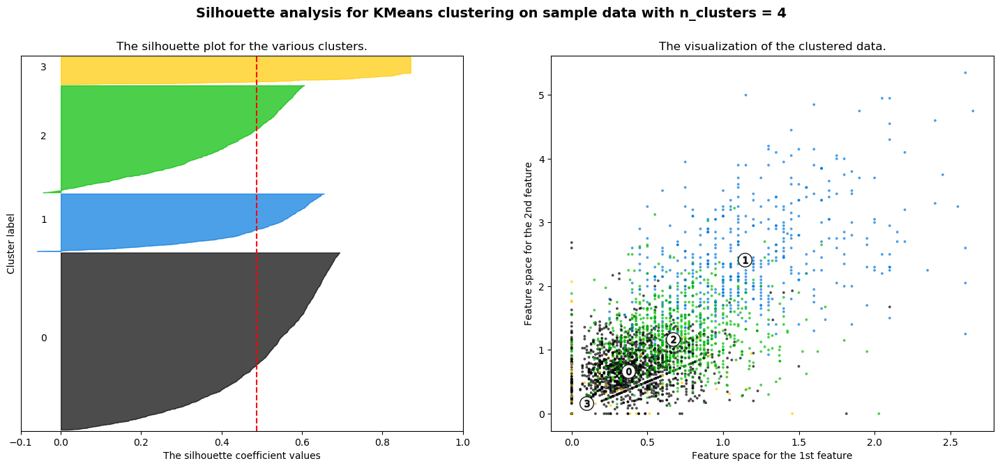

For n_clusters = 5 The average silhouette_score is : 0.45603408019975344


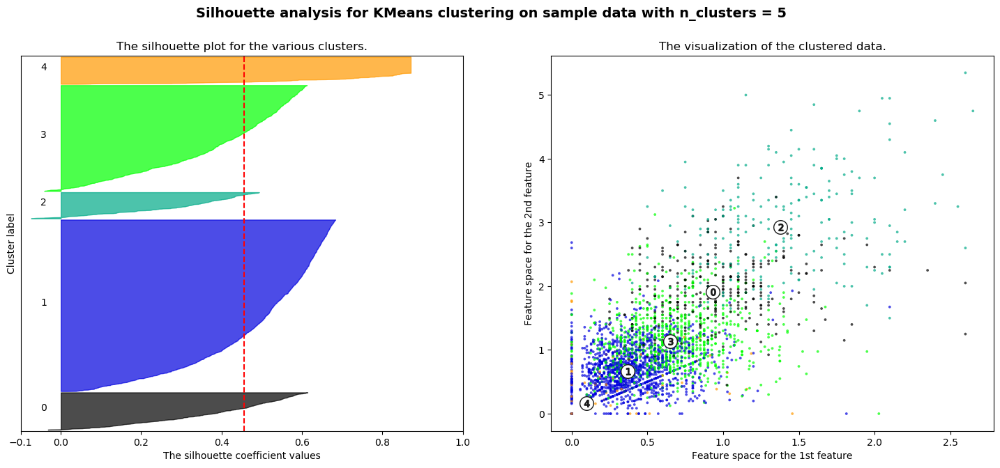

For n_clusters = 6 The average silhouette_score is : 0.3636290229925545


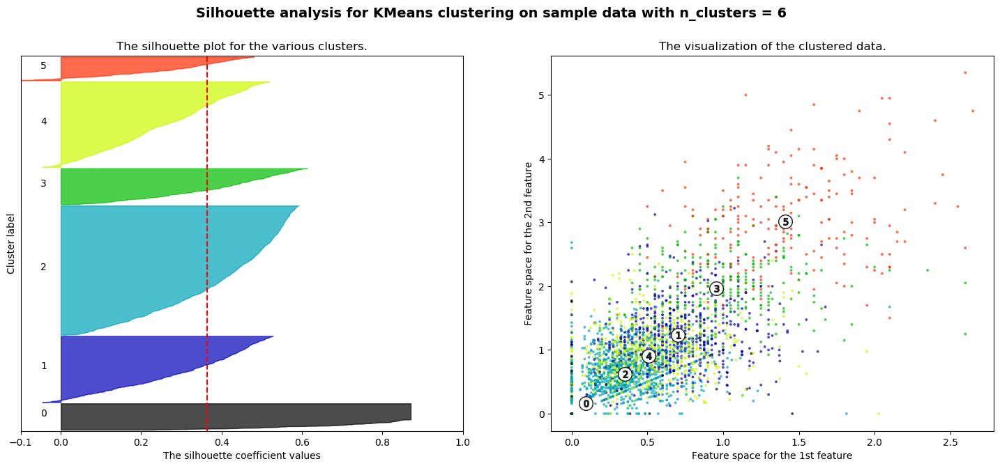

For n_clusters = 7 The average silhouette_score is : 0.3267143572838156


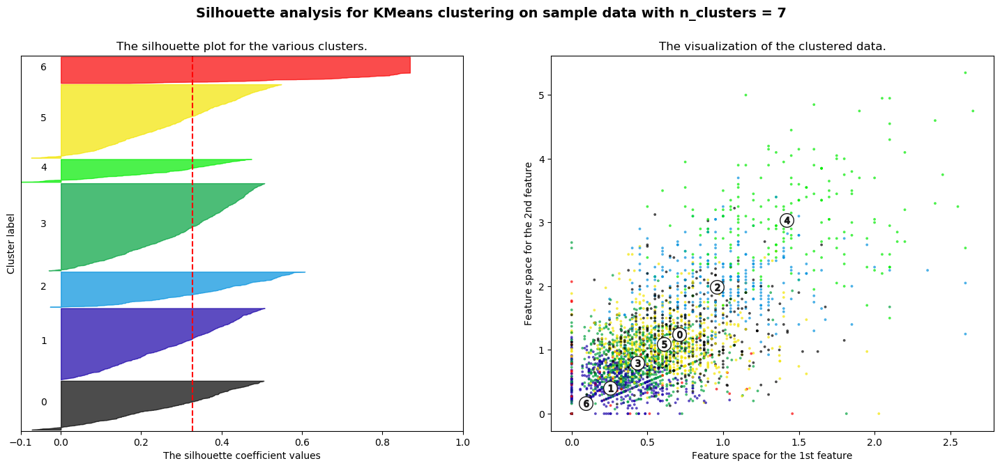

In [61]:
def function_silhouette(X, range_n_clusters):
    cmap = cm.get_cmap('Spectral')
    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        clusterer = KMeans(n_clusters=n_clusters, random_state=22)
        cluster_labels = clusterer.fit_predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10 

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([]) 
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                      fontsize=14, fontweight='bold')
        plt.show()
function_silhouette(x_cols, range(2,8))        

silhouette_score is not changing any furthur by increasing the n_cluster>6. So we can conclude 6 is the number of clusters!


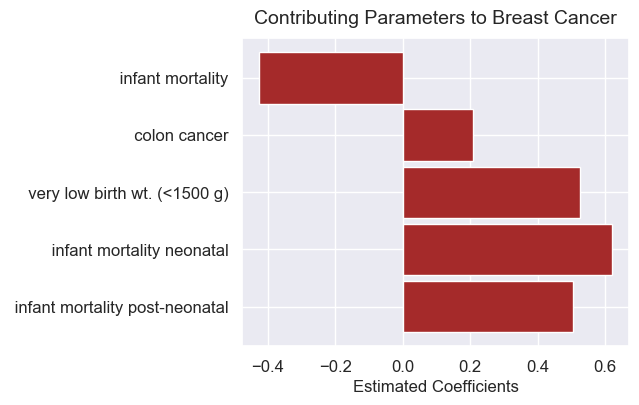

In [62]:
sns.set()
fig, ax = plt.subplots(1, figsize=(5,4))
for labels in contributing_params:
    plt.barh(short_description(labels), 
             Brst_cancer_coefs[Brst_cancer_coefs['features']==labels]['estimatedCoefficients'].values, 
             color='brown', height=0.9)
plt.xlabel('Estimated Coefficients', fontsize=12)
plt.title('Contributing Parameters to Breast Cancer', y=1.02, fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


Hach we have dataset where each county is described by the 5 principle components. Each of these 5 components is a linear combination of the original feature space. We can add these clusters to our dataframe and see how it would change the demographics map:

In [63]:
Predict_Brst_Cancer = model.predict(X)
df['Predict_Brst_Cancer'] = pd.Series(Predict_Brst_Cancer, index=df.index)
df_state['Predict_Brst_Cancer'] = pd.Series(Predict_Brst_Cancer, index=df.index)
df_final['Predict_Brst_Cancer'] = pd.Series(Predict_Brst_Cancer, index=df.index)

#Updating dataframes for plotting:
df_land = us_map_land.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Alaska = us_map_Alaska.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Hawaii = us_map_Hawaii.set_index('NAME').join(df.set_index('CHSI_County_Name'))

df_state_land = us_state_land.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Alaska = us_state_Alaska.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Hawaii = us_state_Hawaii.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
np.unique(Predict_Brst_Cancer)

array([0, 1, 2, 3, 4, 5])

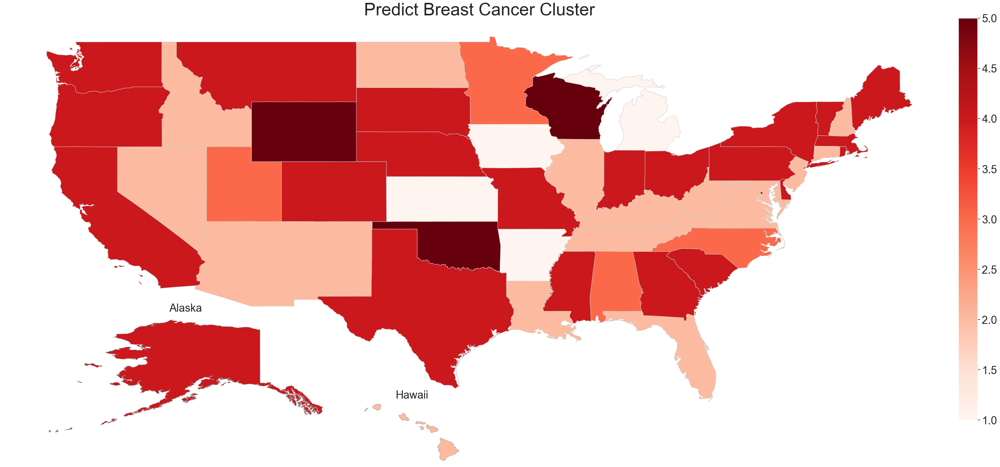

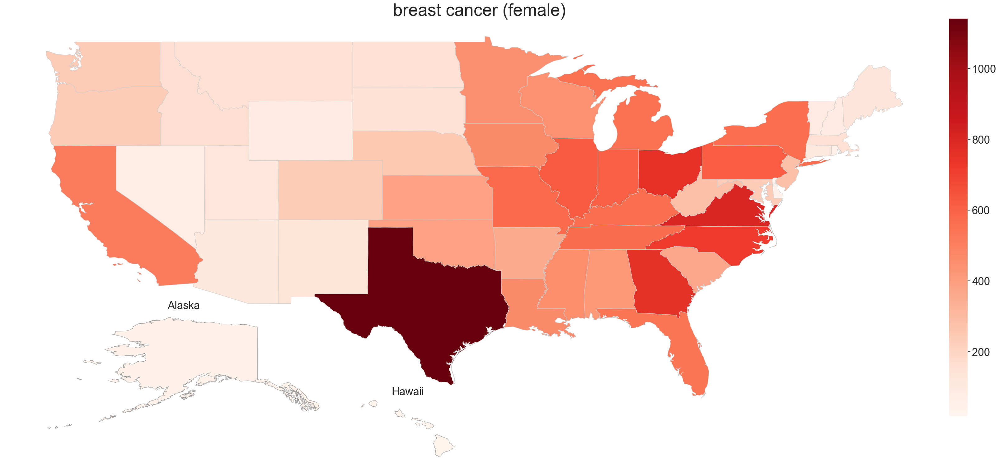

In [64]:
new_item = pd.DataFrame({'COLUMN_NAME':['Predict_Brst_Cancer'], 'DESCRIPTION':['Predict Breast Cancer Cluster']})
DATA_ELEMENT_DESCRIPTION = DATA_ELEMENT_DESCRIPTION.append(new_item, sort=False)


US_state_plot('Predict_Brst_Cancer', 'Reds')
US_state_plot('Brst_Cancer', 'Reds')

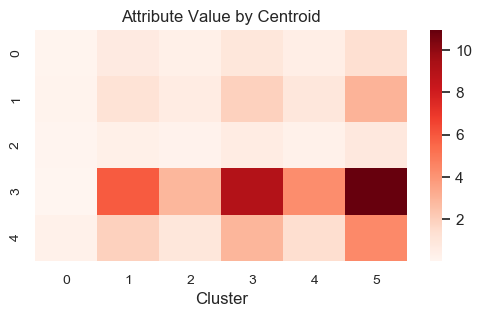

In [65]:
plt.figure(figsize = (6, 3))
ax = sns.heatmap(model.cluster_centers_.T, cmap = 'Reds')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 10)
plt.xticks(fontsize = 10)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [80]:
sns.reset_orig()

<div class="span5 alert alert-info">

### 4.C. Coronary Heart Disease <a class="anchor" id="CHD"></a>

The same set of analysis can be done for other parameters. Here's Coronary Heart Disease:


In [67]:
#Finding important contributing parameters:
drop_list = [*county_info_2,'CHD']
X = df_final.drop(columns=drop_list, axis=1)
y = df_final['CHD']
lm = LinearRegression()
lm.fit(X, y)
CHD_coefs = pd.DataFrame({'features': X.columns, 'estimatedCoefficients': lm.coef_})\
[['features', 'estimatedCoefficients']]
contributing_params = list(CHD_coefs[abs(CHD_coefs['estimatedCoefficients'])>0.6]['features'])

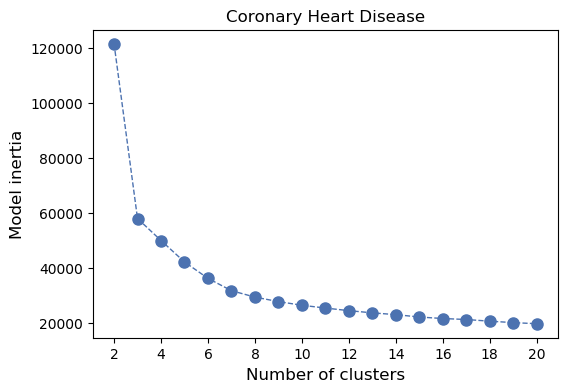

In [68]:
X = df_final.filter(items=contributing_params)
SS = []
x_cols = X.values
K = range(2,21)
for i in K:
    model = KMeans(n_clusters=i, random_state=42)
    model.fit(x_cols)
    SS.append(model.inertia_)
plt.rcParams['figure.figsize'] = (6,4)   
plt.plot(K, SS, 'bo--', linewidth=1, markersize=8)
plt.xlabel('Number of clusters', fontsize=12)
plt.xticks(np.arange(2, 21, step=2), fontsize=10)
plt.ylabel('Model inertia', fontsize=12)
plt.yticks(fontsize=10)
plt.title('Coronary Heart Disease')
plt.show()   


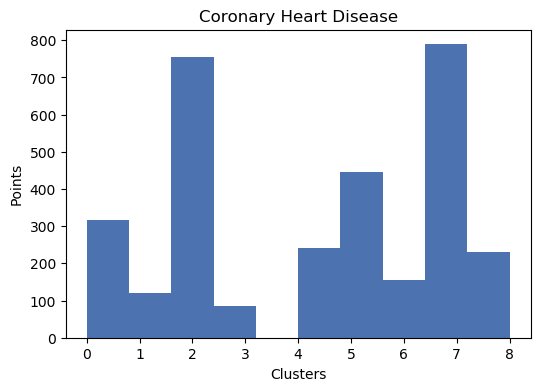

In [69]:
model = KMeans(n_clusters = 9, random_state=42)
model.fit(x_cols)
labels = model.predict(X)
plt.hist(labels, bins=10, color='b')
plt.xlabel('Clusters')
plt.ylabel('Points')
plt.title('Coronary Heart Disease')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.6916389679233265


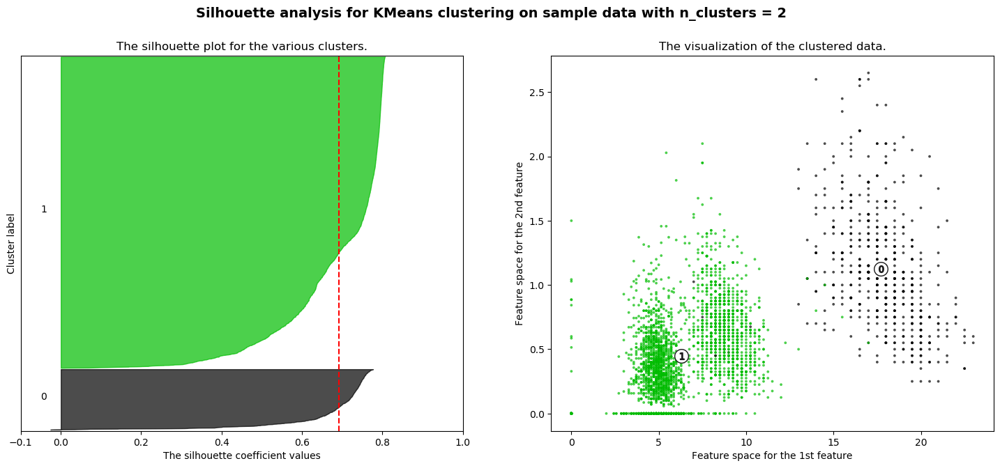

For n_clusters = 3 The average silhouette_score is : 0.5642771210750619


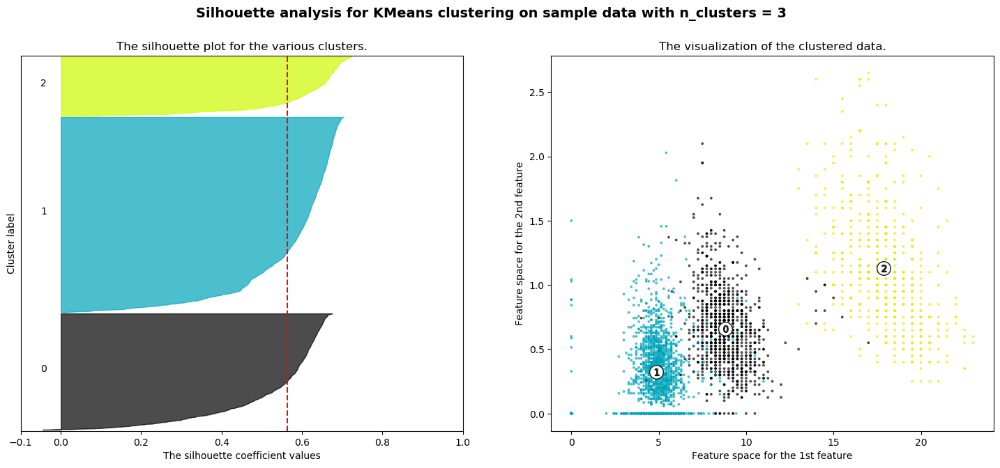

For n_clusters = 4 The average silhouette_score is : 0.41215755300497214


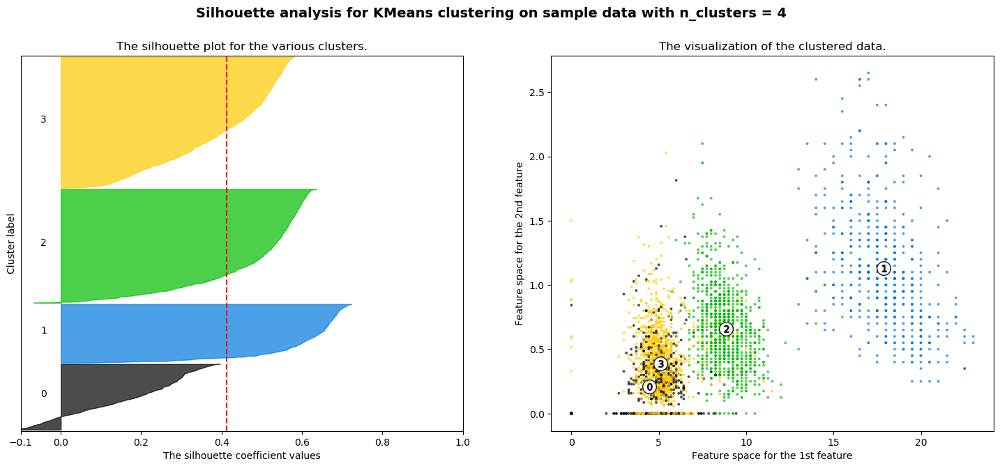

For n_clusters = 5 The average silhouette_score is : 0.37039163081591736


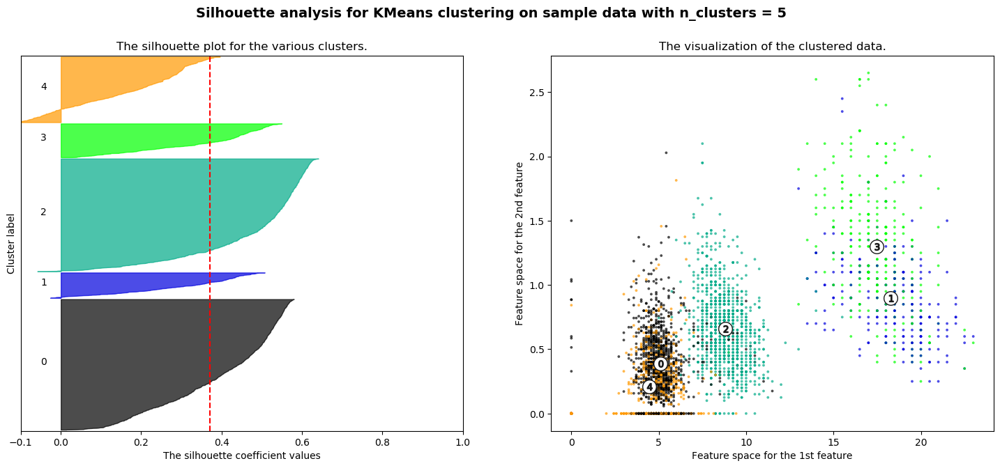

For n_clusters = 6 The average silhouette_score is : 0.3261219012206909


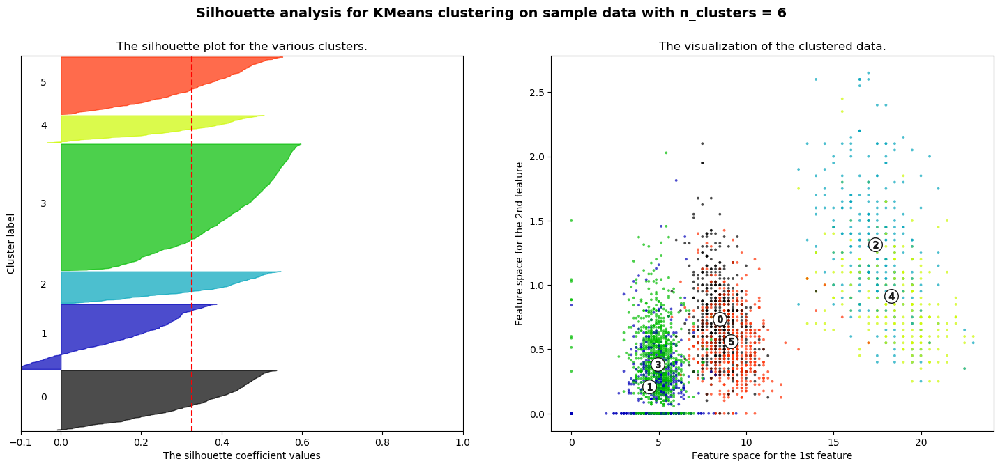

For n_clusters = 7 The average silhouette_score is : 0.3143567610974994


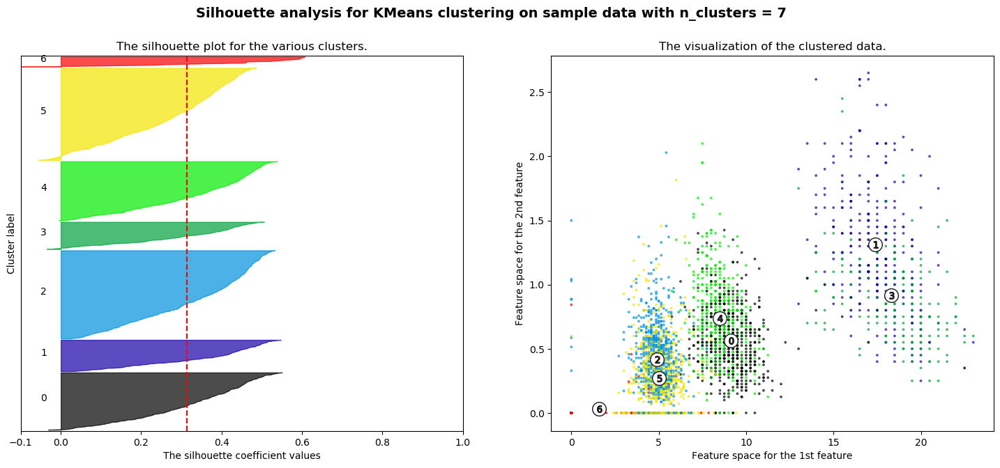

For n_clusters = 8 The average silhouette_score is : 0.30145044506463337


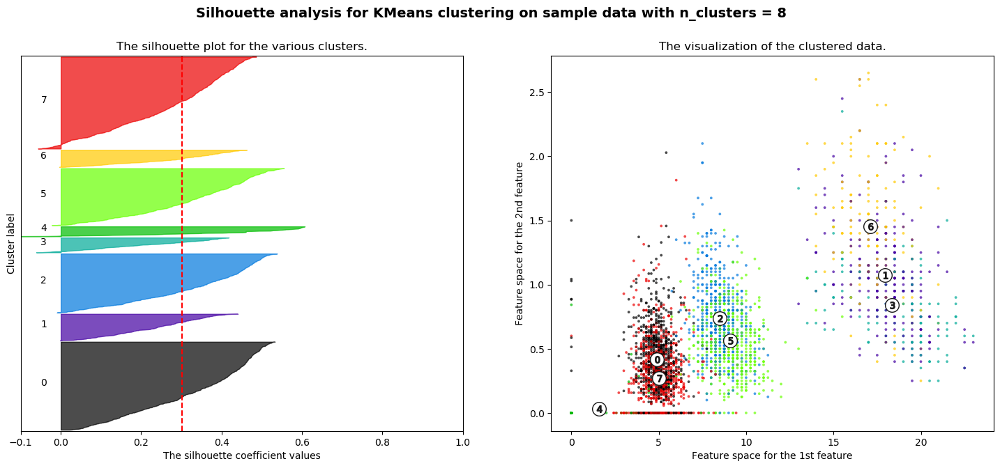

For n_clusters = 9 The average silhouette_score is : 0.27385933999858186


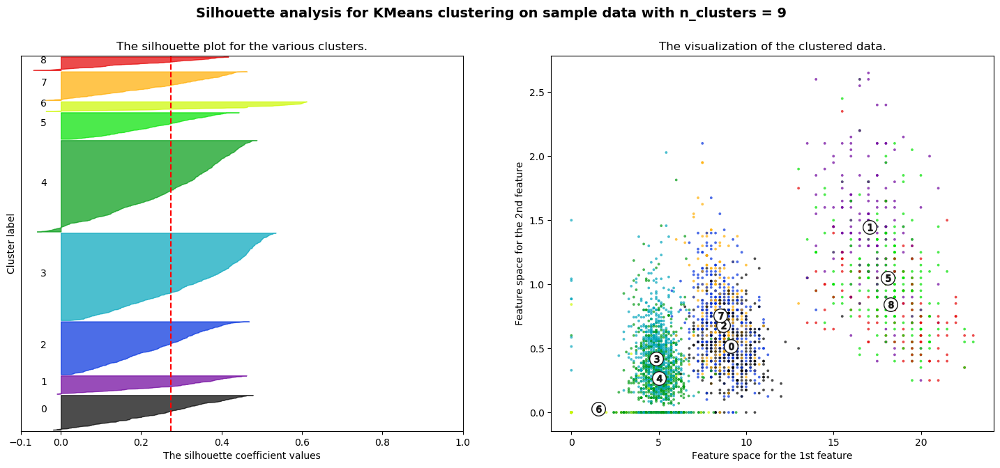

For n_clusters = 10 The average silhouette_score is : 0.22820799982471213


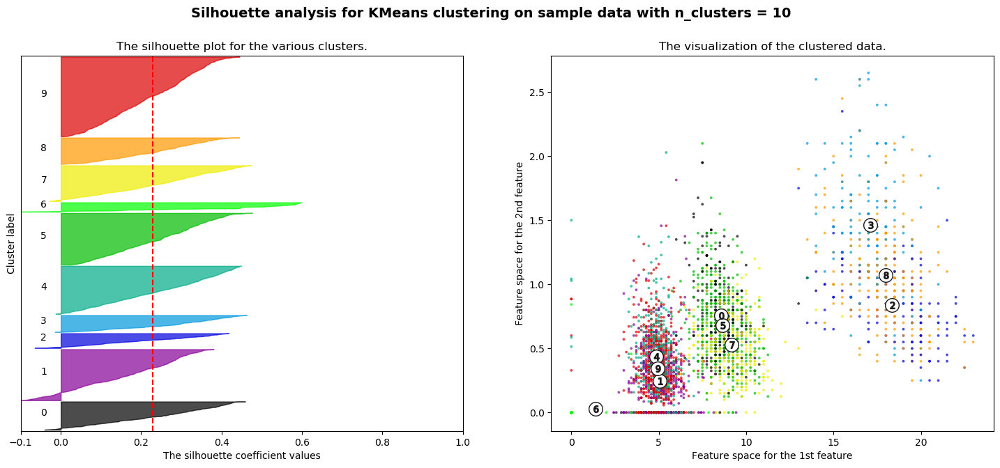

For n_clusters = 11 The average silhouette_score is : 0.22023967228527366


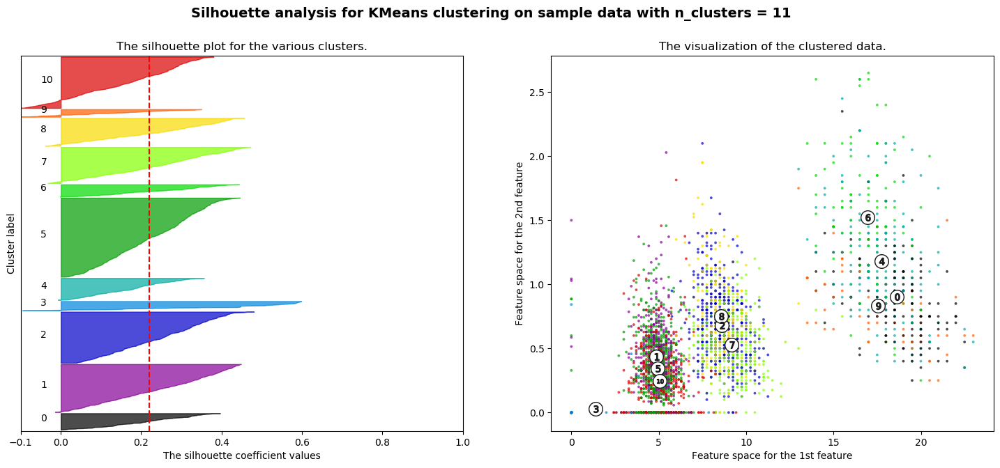

For n_clusters = 12 The average silhouette_score is : 0.22735227983289993


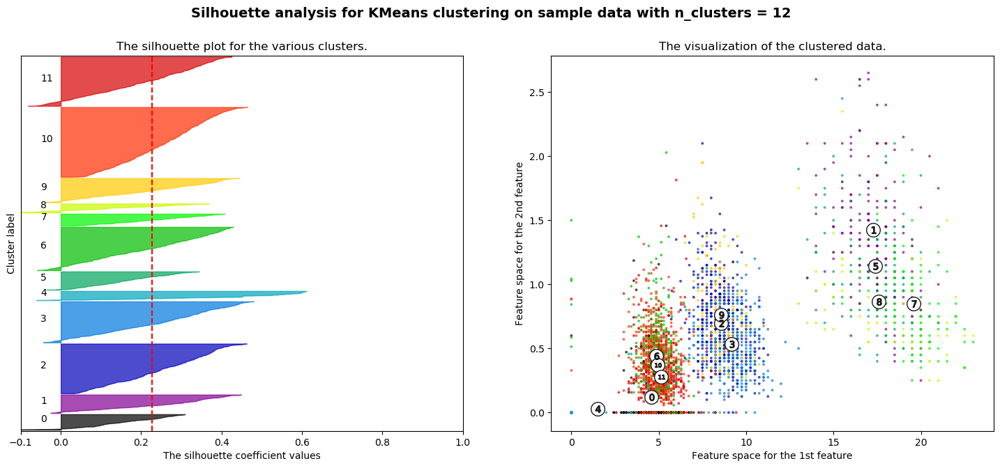

In [70]:
function_silhouette(x_cols, range(2,13))

For n_cluster>9 silouette_score remain unchanged ~0.22, thus we can conclude 9 is the number of clusters!


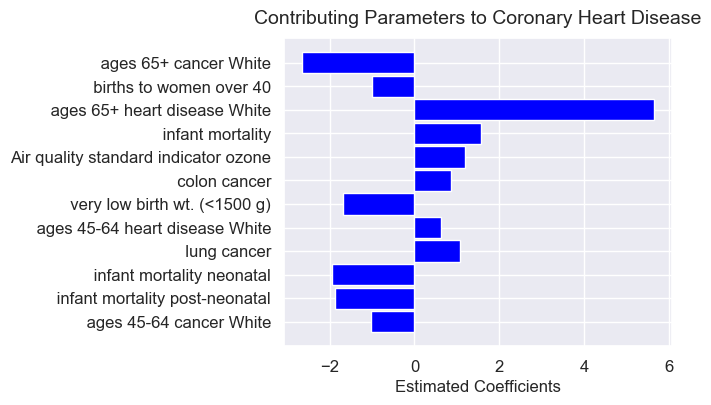

In [71]:
sns.set()
fig, ax = plt.subplots(1, figsize=(5,4))
for labels in contributing_params:
    plt.barh(short_description(labels), 
             CHD_coefs[CHD_coefs['features']==labels]['estimatedCoefficients'].values, 
             color='blue', height=0.9)
plt.xlabel('Estimated Coefficients', fontsize=12)
plt.title('Contributing Parameters to Coronary Heart Disease', y=1.02, fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [72]:
Predict_CHD = model.predict(X)
df['Predict_CHD'] = pd.Series(Predict_CHD, index=df.index)
df_state['Predict_CHD'] = pd.Series(Predict_CHD, index=df.index)
df_final['Predict_CHD'] = pd.Series(Predict_CHD, index=df.index)

#Updating dataframes for plotting:
df_land = us_map_land.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Alaska = us_map_Alaska.set_index('NAME').join(df.set_index('CHSI_County_Name'))
df_Hawaii = us_map_Hawaii.set_index('NAME').join(df.set_index('CHSI_County_Name'))

df_state_land = us_state_land.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Alaska = us_state_Alaska.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))
df_state_Hawaii = us_state_Hawaii.set_index('STATE_ABBR').join(df_state.set_index('CHSI_State_Abbr'))


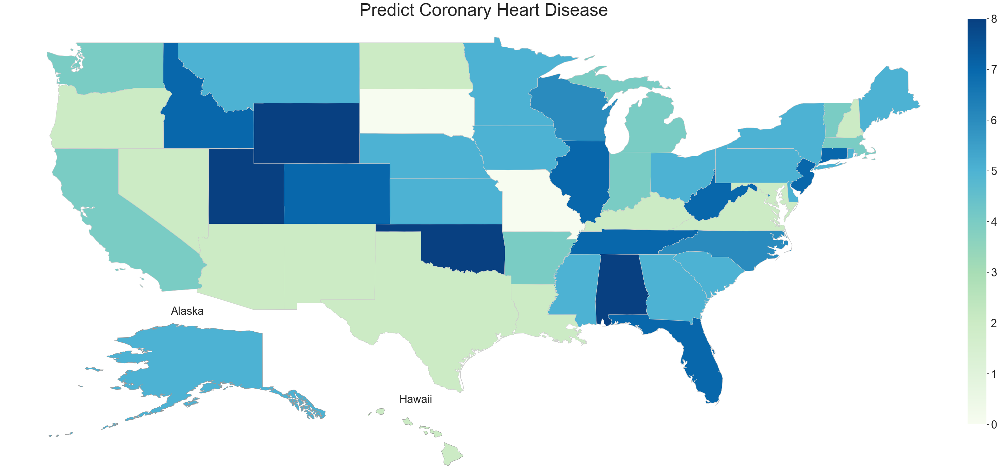

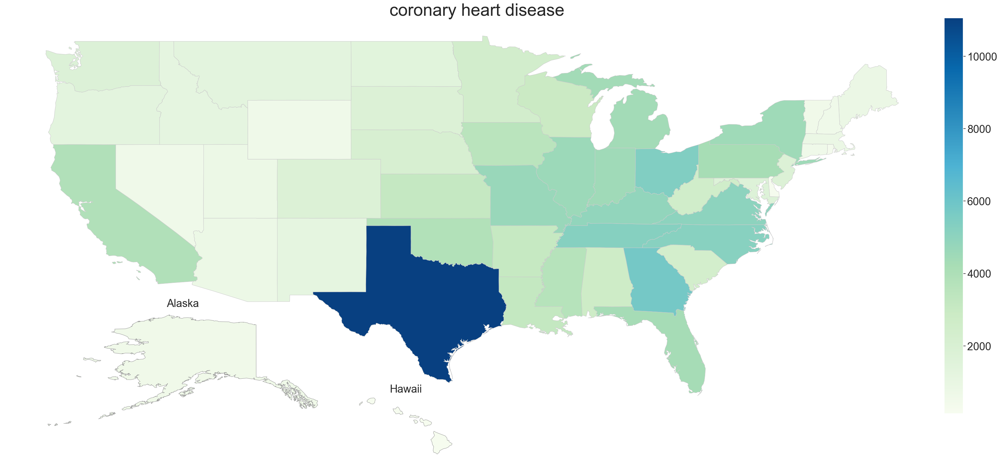

In [73]:
new_item = pd.DataFrame({'COLUMN_NAME':['Predict_CHD'], 'DESCRIPTION':['Predict Coronary Heart Disease']})
DATA_ELEMENT_DESCRIPTION = DATA_ELEMENT_DESCRIPTION.append(new_item, sort=False)


US_state_plot('Predict_CHD', 'GnBu')
US_state_plot('CHD', 'GnBu')
